# <span style='color:SteelBlue'>P6 - Segmentez des clients d'un site e-commerce</span>

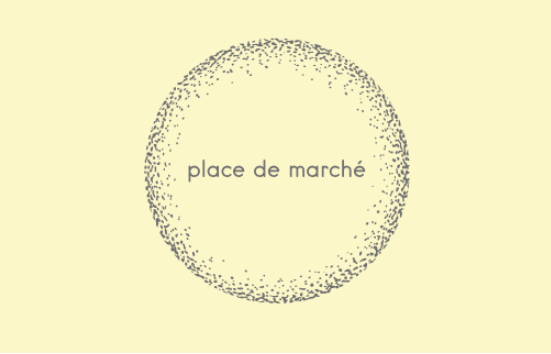

# <span class='bg-primary'>P6_02 - IMAGES - Données Images</span>

# <span class='bg-primary'>P6_02_01 - SIFT - ORB - SURF</span>

## <span style='background:Thistle'>Sommaire du notebook</span> 

In [1]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

Ce Notebook traite les images avec les méthodes classiques (SIFT, ORB) avec classification non supervisée et classification supervisée.

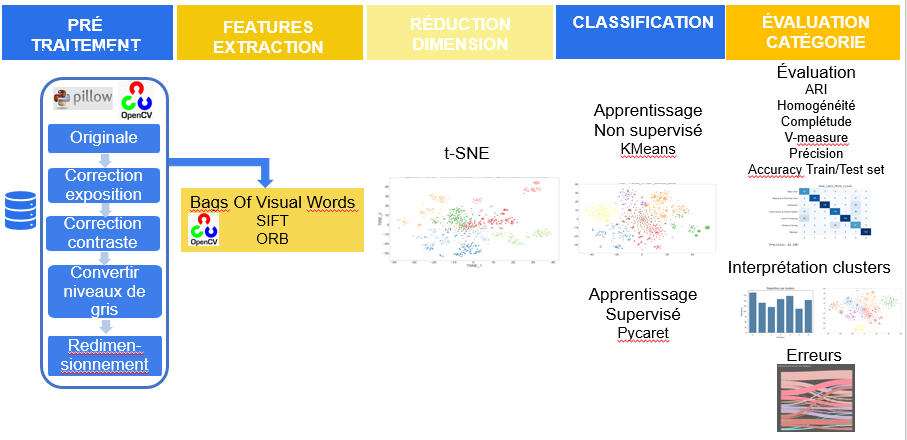

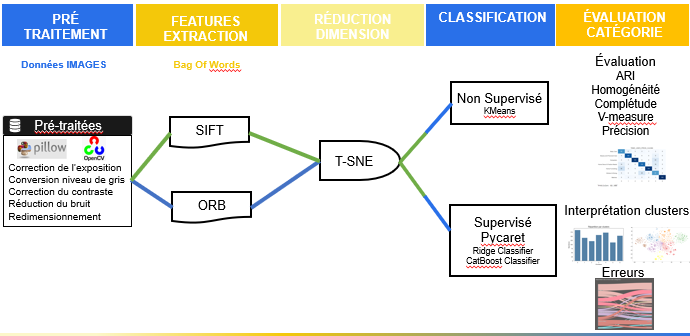

## <span style='background:Thistle'>1. Introduction</span>

**Mission**
*****
Réaliser une première **étude de faisabilité** d'un moteur de **classification d'articles** basé sur une **image et une description** pour l'**automatisation** de l'attribution de la **catégorie de l'article**.

**Objectifs**
*****
- analyser le jeu de données,
- réaliser :
    - un prétraitement des images,
    - un prétraitement des descriptions des produits
    - une réduction de dimension, 
    - puis un clustering. 

La représentation graphique aidera à convaincre que cette approche de modélisation permettra bien de regrouper des produits de même catégorie.

**Contraintes**
***
Afin d’extraire les features, mettre en œuvre a minima un algorithme de type SIFT / ORB / SURF (un algorithme de type CNN Transfer Learning peut éventuellement être utilisé en complément, s’il peut apporter un éclairage supplémentaire à la démonstration).

**Sources**
*****
- [Jeu de données](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/Parcours_data_scientist/Projet+-+Textimage+DAS+V2/Dataset+projet+pre%CC%81traitement+textes+images.zip)

In [2]:
# Chargement des librairies
import datetime
import sys
from datetime import datetime
import jyquickhelper
import numpy as np
import pandas as pd
import pickle
import os
import time
from IPython.core.display import display, HTML
import outils_data
import outils_nlp
import outils_visu
import outils_images
# import outils_acp
import outils_segmentation
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# Réduction dimension
from sklearn.manifold import TSNE
# Clustering
from sklearn.cluster import KMeans
# Traitement images
import PIL
from PIL import Image, ImageOps, ImageFilter
import cv2
from scipy.ndimage import gaussian_filter

# Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
%load_ext pycodestyle_magic
%pycodestyle_on
# %pycodestyle_off

# Versions
print('Version des librairies utilisées :')
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('PIL                   : ' + PIL.__version__)
print('OpenCV                : ' + cv2.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils NLP            : ' + outils_nlp.__version__)
print('Outils visualisation  : ' + outils_visu.__version__)
print('Outils images         : ' + outils_images.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
jyquickhelper         : 0.4.220
Python                : 3.8.8 (default, Feb 24 2021, 15:54:32) [MSC v.1928 64 bit (AMD64)]
NumPy                 : 1.19.5
Pandas                : 1.2.4
Matplotlib            : 3.3.4
Seaborn               : 0.11.0
PIL                   : 8.2.0
OpenCV                : 4.5.1
Outils dataframe      : 0.0.2
Outils NLP            : 0.0.0
Outils visualisation  : 0.0.2
Outils images         : 0.0.0
Lancé le           : 2021-06-24T11:38:05.230932


In [3]:
dico_pd_option = {
    'display.max_rows': 400,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 5,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

## <span style='background:Thistle'>2. Jeu de données</span>

### <span style='background:PowderBlue'>2.1. Chargement du jeu de données</span>

In [4]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21

In [5]:
# Chargement du jeu de données
data_all = pd.read_csv('data/flipkart_com-ecommerce_sample_1050.csv')

In [5]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data_all.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1050 lignes et 15 variables.


In [7]:
data_all.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-multicolor-abstract-eyelet-door-curtain/p/itmeg7bkzdgthcts?pid=CRNEG7BKMFFYHQ8Z,Elegance Polyester Multicolor Abstract Eyelet Door Curtain,"[""Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do...""]",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,"Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that ...",No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""value""=>""Elegance""}, {""key""=>""Designed For"", ""value""=>""Door""}, {""key""=>""Type"", ""value""=>""Eyelet""}, {""key""=>""Model Name"", ""value""=>""Abstract Polyester Door Curtain Set Of 2""}, {""key""=>""Model ID"", ""value""=>""Duster25""}, {""key""=>""Color"", ""value""=>""Multicolor""}, {""key""=>""Length"", ""value""=>""213 cm""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""Pack of 2""}, {""key""=>""Sales Package"", ""value""=>""2 Curtains""}, {""key""=>""Material"", ""value""=>""Polyester""}]}"
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-towel/p/itmegfzhxbyucwgn?pid=BTWEGFZHGBXPHZUH,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath Towels >> Sathiyas Baby Bath Towels >> Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Y...""]",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,"Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel",No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Washable"", ""value""=>""Yes""}, {""key""=>""Material"", ""value""=>""Cotton""}, {""key""=>""Design"", ""value""=>""Self Design""}, {""key""=>""Brand"", ""value""=>""Sathiyas""}, {""key""=>""Type"", ""value""=>""Bath Towel""}, {""key""=>""GSM"", ""value""=>""500""}, {""key""=>""Model Name"", ""value""=>""Sathiyas cotton bath towel""}, {""key""=>""Ideal For"", ""value""=>""Men, Women, Boys, Girls""}, {""key""=>""Model ID"", ""value""=>""asvtwl322""}, {""key""=>""Color"", ""value""=>""Red, Yellow, Blue""}, {""key""=>""Size"", ""value""=>""Mediam""}, {""key""=>""Length"", ""value""=>""30 inch""}, {""key""=>""Width"", ""value""=>""60 inch""}, {""key""=>""Number of Contents in Sales Package"", ""value""=>""3""}, {""key""=>""Sales Package"", ""value""=>""3 Bath Towel""}]}"


### <span style='background:PowderBlue'>2.2. Préparation du dataframe de travail pour le traitement des images</span>

**image_loc**

- La variable '**image**' est constituée de la concaténation du e l'identifiant unique (ex : 02127f52e96fb72c66bf081d25104ef8) suivi de '.jpg' : **02127f52e96fb72c66bf081d25104ef8.jpg**.
- Ajout d'une nouvelle variable **image_loc** contenant le chemin du répertoire de stockage des images ainsi que du nom du fichier image pour des appels moins verbeux dans le code.

In [6]:
# Ajout variable image_loc
# ex : data/Images/02127f52e96fb72c66bf081d25104ef8.jpg
path = 'data/Images/'
data_all['image_loc'] = [path + row for row in data_all['image']]

**Récupération de la première sous-catégorie**

In [7]:
# Découpe les sous-catégories dans des nouvelles variables du dataframe
work = data_all['product_category_tree'].str.split(' >> ', expand=True)
data_all['Categorie_1'] = work[0]
# Nettoye les [" et "]
data_all.replace('\\["', '', regex=True, inplace=True)
data_all.replace('"\\]', '', regex=True, inplace=True)

**Dataframe de travail pour le traitement des images**

- Pour effectuer la classification des catégories en fonction des images, nous garderons :
    - [x] **image** : le nom de l'image,
    - [x] **image_loc** : le nom de l'image avec sa localisation dans le répertoire de stockage des images,
    - [x] **Categorie_1** : la première sous-catégorie.

In [8]:
data = data_all.copy()
data = data[['image', 'image_loc', 'Categorie_1']]
data.head(3)

,image,image_loc,Categorie_1
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,data/Images/55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home Furnishing
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,data/Images/7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby Care
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,data/Images/64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby Care


### <span style='background:PowderBlue'>2.3. Analyse exploratoire des images</span>

**Nombre d'images par catégorie ?**

In [12]:
%pycodestyle_off

In [13]:
df_image_par_cat = data.groupby('Categorie_1').agg({'image' : 'count'})
df_image_par_cat

,image
Categorie_1,
Baby Care,150
Beauty and Personal Care,150
Computers,150
Home Decor & Festive Needs,150
Home Furnishing,150
Kitchen & Dining,150
Watches,150


In [14]:
%pycodestyle_on

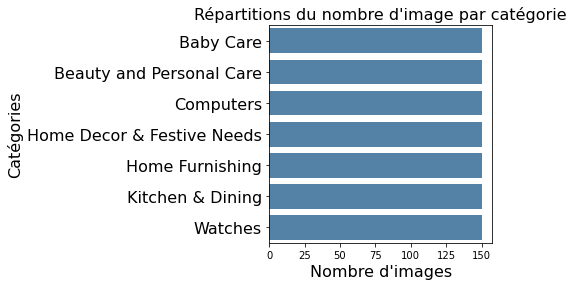

In [21]:
plt.figure(figsize=(4, 4))
sns.barplot(y=df_image_par_cat.index, x=df_image_par_cat.image,
            data=df_image_par_cat, color='SteelBlue')
plt.title('Répartitions du nombre d\'image par catégorie', fontsize=16)
plt.xlabel('Nombre d\'images', fontsize=16)
plt.ylabel('Catégories', fontsize=16)
plt.yticks(fontsize=16)
plt.grid(False)
plt.show()

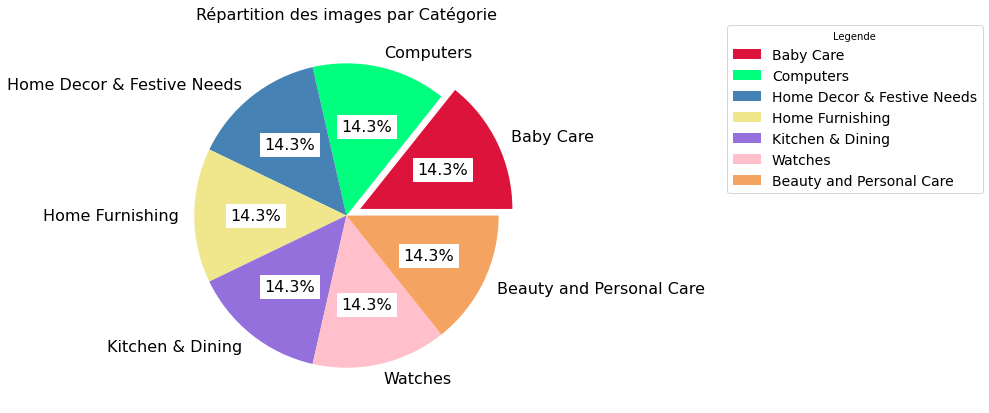

In [52]:
df_visu = df_image_par_cat.reset_index()
outils_visu.trace_pieplot(df_visu, 'Categorie_1',
                          'Répartition des images par Catégorie',
                          'Legende',
                          ['Crimson', 'SpringGreen', 'SteelBlue', 'Khaki',
                           'MediumPurple', 'pink', 'SandyBrown'])

- Répartition équilibrée de 150 images par catégorie.

**Visualisation d'un échantillon d'images**

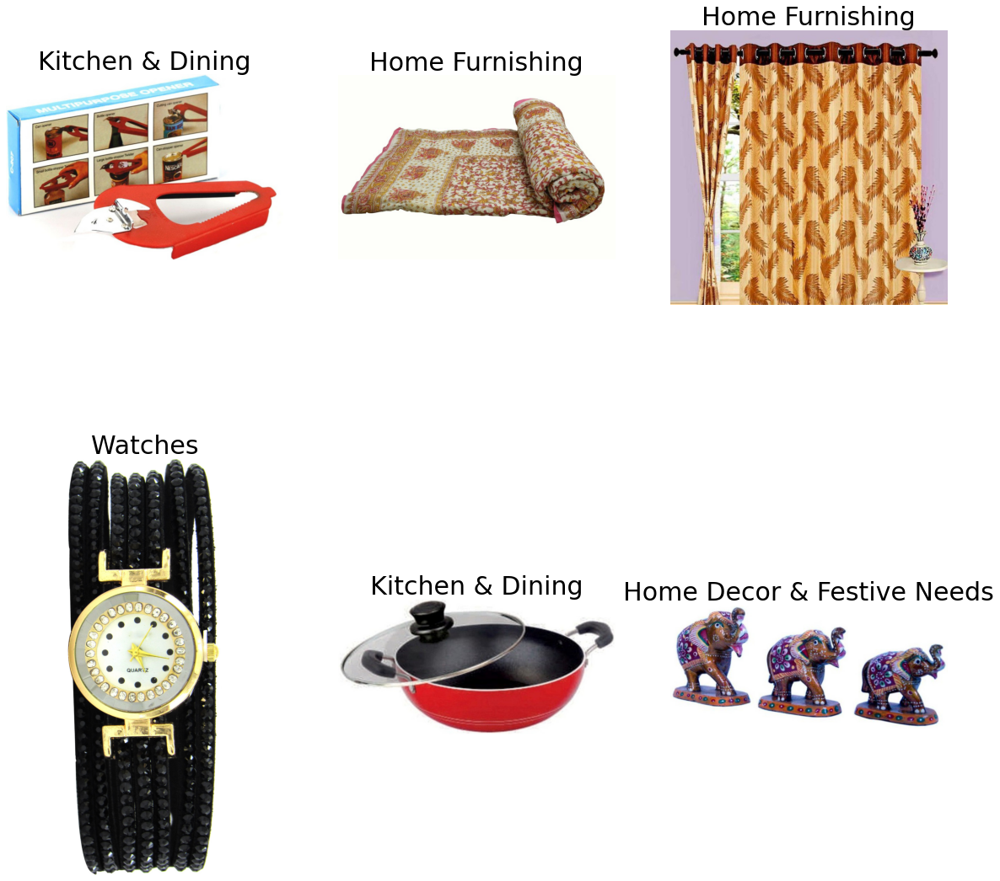

In [69]:
# Sélection de 6 images au hasard
df_visu_img = data.sample(6).reset_index()
plt.figure(figsize=(20, 20))
for i in range(6):
    plt.subplot(2, 3, i + 1)
    # Charge l'image comme matrice de pixels
    img = np.array(Image.open(df_visu_img['image_loc'][i]))
    plt.imshow(img)
    plt.title(df_visu_img['Categorie_1'][i], fontsize=30)
    plt.axis('off')

**Taille des images**

In [100]:
# Statistiques descriptives
outils_data.stat_descriptives(data, ['Taille_img', 'Largeur_img',
                                     'Hauteur_img', ])

Desc,Taille_img,Largeur_img,Hauteur_img
mean,1916300.21333,1196.57048,1220.03810
median,1015850.00000,1100.00000,1100.00000
var,15345750661385.32617,745917.58027,554260.29379
std,3917365.27036,863.66520,744.48660
skew,13.45714,2.84579,3.66122
kurtosis,289.37178,11.64657,31.76093
mode,0 928400,0 1100,0 1100
Min,58000,145,160
Max,93680328,8484,11042


***Largeur des images***

In [9]:
# Largeur des images
data['Largeur_img'] = [Image.open(row).size[0] for row in data['image_loc']]

In [102]:
# Plage des largeurs des images
df_ditrib_largeur = outils_data.distribution_variables_plages(
    data, 'Largeur_img', [0, 500, 1000, 5000, 10000])
df_ditrib_largeur.style.hide_index()

Plage,nb_données,%_données
"(0, 500]",146,13.90476
"(500, 1000]",273,26.00000
"(1000, 5000]",622,59.23810
"(5000, 10000]",9,0.85714


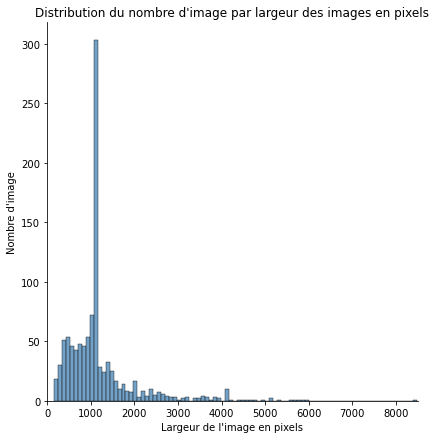

In [104]:
# Répartition du nombre d'images par taille de l'image en pixel
sns.displot(data['Largeur_img'], color='SteelBlue', height=6)
plt.title('Distribution du nombre d\'image par largeur des images en pixels')
plt.xlim(0, 8500)
plt.xlabel('Largeur de l\'image en pixels')
plt.ylabel('Nombre d\'image')
plt.show()

- Les largeurs des images ne sont pas uniformes et réparties de manière inégale, il faudra les uniformiser pour utiliser les algorithmes de traitement des images.

***Hauteur des images***

In [10]:
# Hauteur des images
data['Hauteur_img'] = [Image.open(row).size[1] for row in data['image_loc']]

In [107]:
# Plage des hauteurs des images
df_ditrib_hauteur = outils_data.distribution_variables_plages(
    data, 'Hauteur_img', [0, 500, 1000, 5000, 11100])
df_ditrib_largeur.style.hide_index()

Plage,nb_données,%_données
"(0, 500]",146,13.90476
"(500, 1000]",273,26.00000
"(1000, 5000]",622,59.23810
"(5000, 10000]",9,0.85714


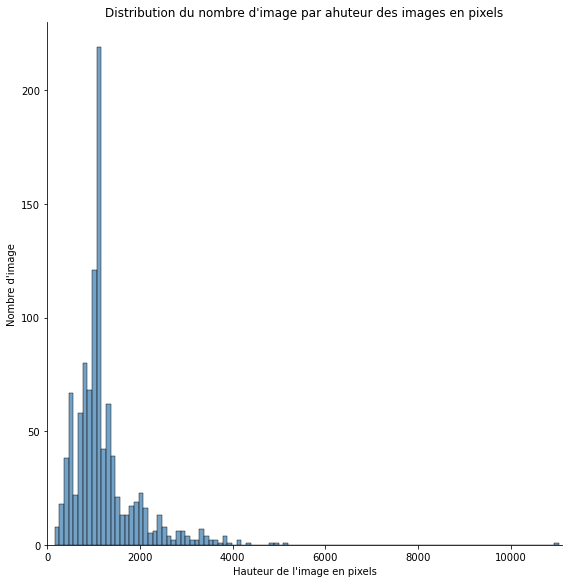

In [110]:
# Répartition du nombre d'images par taille de l'image en pixel
sns.displot(data['Hauteur_img'], color='SteelBlue', height=8)
plt.title('Distribution du nombre d\'image par ahuteur des images en pixels')
plt.xlim(0, 11100)
plt.xlabel('Hauteur de l\'image en pixels')
plt.ylabel('Nombre d\'image')
plt.show()

- Les largeurs des images ne sont pas uniformes et réparties de manière inégale, il faudra les uniformiser pour utiliser les algorithmes de traitement des images.

***Taille des images***

In [11]:
# Taille des images
data['Taille_img'] = [(Image.open(row).size[0] * Image.open(row).size[1])
                      for row in data['image_loc']]

In [99]:
# Plage des largeurs des images
df_ditrib_taille = outils_data.distribution_variables_plages(
    data, 'Largeur_img', [0, 500000, 1000000, 5000000, 10000000,
                         100000000])
df_ditrib_taille.style.hide_index()

Plage,nb_données,%_données
"(0, 500000]",165,15.71429
"(500000, 1000000]",353,33.61905
"(1000000, 5000000]",447,42.57143
"(5000000, 10000000]",52,4.95238
"(10000000, 100000000]",33,3.14286


In [98]:
# Plage des tailles des images
df_ditrib_taille = outils_data.distribution_variables_plages(
    data, 'Taille_img', [0, 500000, 1000000, 5000000, 10000000,
                         100000000])
df_ditrib_taille.style.hide_index()

Plage,nb_données,%_données
"(0, 500000]",165,15.71429
"(500000, 1000000]",353,33.61905
"(1000000, 5000000]",447,42.57143
"(5000000, 10000000]",52,4.95238
"(10000000, 100000000]",33,3.14286


In [77]:
%pycodestyle_off

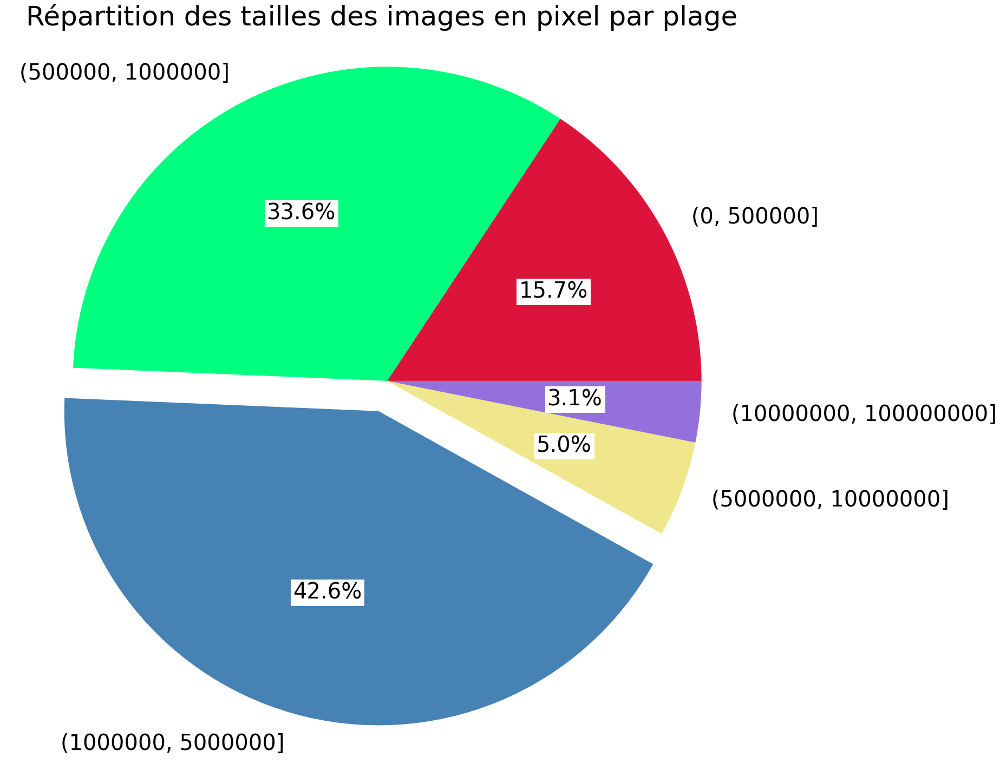

In [78]:
# Pieplot de visualisation
df_visu_taille = df_ditrib_taille[df_ditrib_taille['nb_données'] != 0]
plt.figure(figsize=(25, 25))
plt.pie(df_visu_taille['nb_données'],
        explode=(0, 0, 0.1, 0, 0),
        labels=df_visu_taille['Plage'],
        autopct='%1.1f%%',
        colors=['Crimson', 'SpringGreen', 'SteelBlue', 'Khaki',
                'MediumPurple', 'pink', 'SandyBrown', 'Aqua', 'Tomato',
                'Khaki'],
        textprops={'fontsize':40, 'color':'black',
                   'backgroundcolor':'w'})
plt.title('Répartition des tailles des images en pixel par plage',
          fontsize=50)
plt.axis('equal')
plt.show() 

In [79]:
%pycodestyle_on

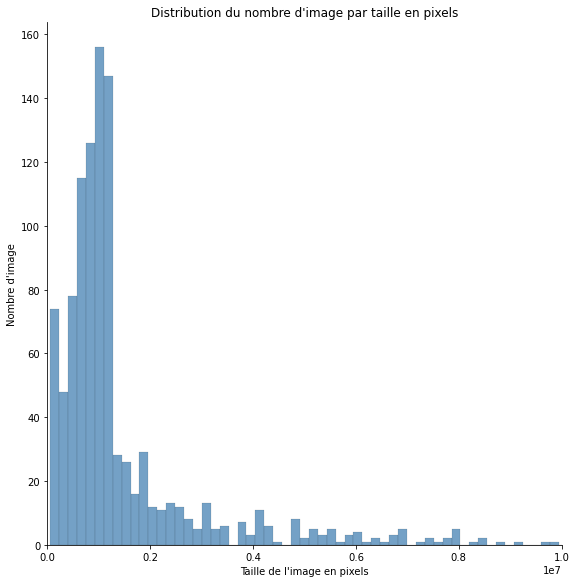

In [97]:
# Répartition du nombre d'images par taille de l'image en pixel
sns.displot(data['Taille_img'], color='SteelBlue', height=8)
plt.title('Distribution du nombre d\'image par taille en pixels')
plt.xlim(0, 10000000)
plt.xlabel('Taille de l\'image en pixels')
plt.ylabel('Nombre d\'image')
plt.show()

- Les images sont de tailles très inégales, il faudra les uniformiser en les redimensionnant pour pouvoir utiliser les réseaux de neurones et les CNN Transfert learning.
- Les tailles des images en entrées des réseaux de neurones sont 224 * 224, une partie du traitement des images sera de redimensionner en 224 * 224.

**Format des images**

In [12]:
# Format des images
data['Format_img'] = [Image.open(row).mode for row in data['image_loc']]

In [114]:
data.groupby('Format_img').count()

,image,image_loc,Categorie_1,Largeur_img,Hauteur_img,Taille_img
Format_img,,,,,,
RGB,1050,1050,1050,1050,1050,1050


- Toutes les images sont au format RGB : (3*8-bit pixels, true color).

[Source](https://pillow.readthedocs.io/en/stable/handbook/concepts.html)

## <span style='background:Thistle'>3. Pré-traitement des images</span>

- **PILS** (Pyhton Imaging Library) et **OpenCV** (Open Compute Vision) sont des librairies qui comprennent un ensemble de méthodes permettant de charger, traiter les images (redimensionnement, filtres...).
- Ces librairies seront utilisées pour le pré-traitement des images.

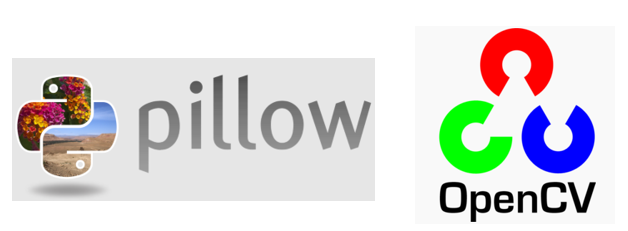

[Source](https://opencv.org/)

- Le traitement sera effectué en 4 étapes :
    - redimensionnement en 224 * 224,
    - conversion de RGB (couleurs vraies) en niveaux de gris (pour Sift),
    - suppression du bruit,
    - égalisation de l'histogramme.


### <span style='background:PowderBlue'>3.1. Pré-traitement sur une image</span>

In [13]:
dim = (224, 224)

<span style='background:Moccasin'>**Chargement de l'image originale**</span>

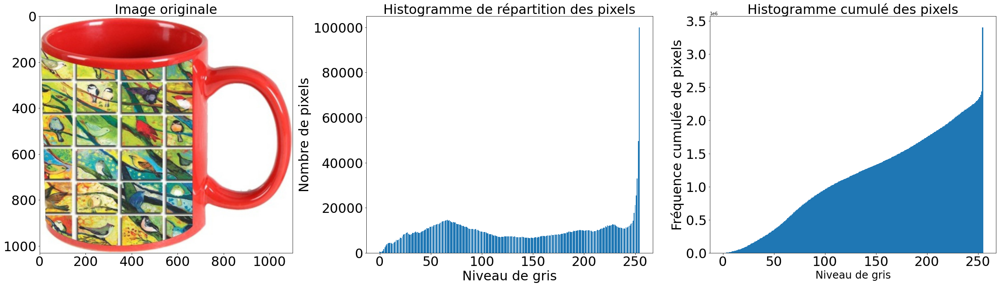

In [16]:
# Chargement de l'image originale comme matrice de pixels
img_orig = Image.open('data/Images/3c4ca34c50a5437a1bcc42b72fc1351f.jpg')
outils_images.afficher_image_histopixel(img_orig, 'Image originale')

<span style='background:Moccasin'>**Correction de l'exposition (étirement d'histogramme)**</span>

- Corriger de la luminosité (ou exposition) de l'image.
- Image sous-exposée ==> histogramme concentré à droite vers les niveaux de gris faible (255 = blanc).
- Image sur-exposée ==> histogramme concentré à gauche vers les niveaux de gris fort (0 = noir).

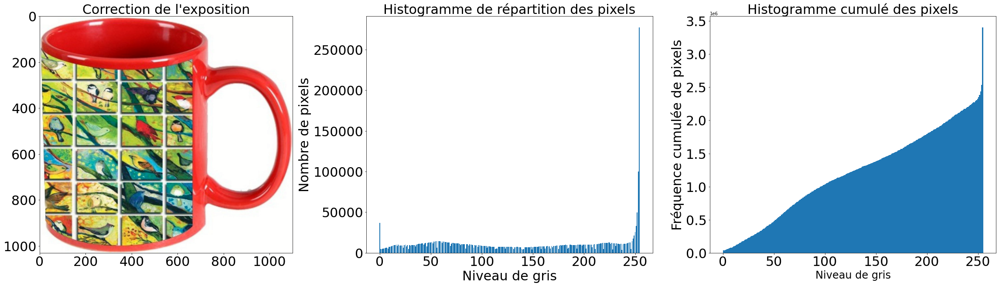

In [17]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
outils_images.afficher_image_histopixel(img_expo,
                                        'Correction de l\'exposition')

<span style='background:Moccasin'>**Correction du contraste (égalisation d'histogramme)**</span>

*Le contraste caractérise la répartition de lumière dans une image : plus une image est contrastée, plus la différence de luminosité entre ses zones claires et sombres est importante. En général, une image peu contrastée est terne, tandis qu'une image trop contrastée est visuellement "agressive". Dans les deux cas, l'image manque de clarté car certains de ses détails seront peu, voire pas du tout,  visibles.*

[Source openclassrooms cours sur les données visuelles]

***PILS***

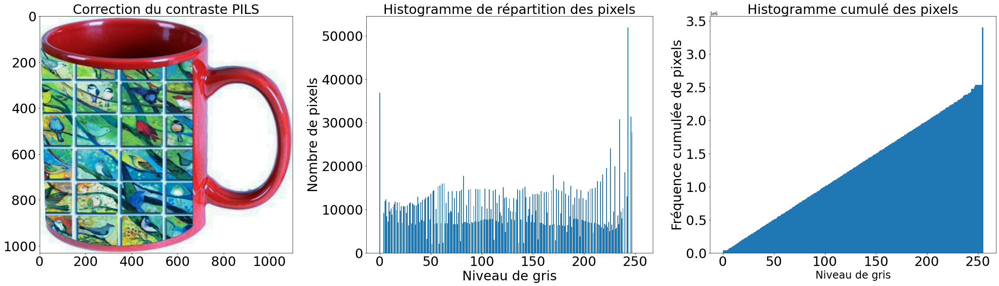

In [18]:
# Correction du contraste PILS
img_contr_pils = ImageOps.equalize(img_expo)
outils_images.afficher_image_histopixel(img_contr_pils,
                                        'Correction du contraste PILS')

***OpenCV***

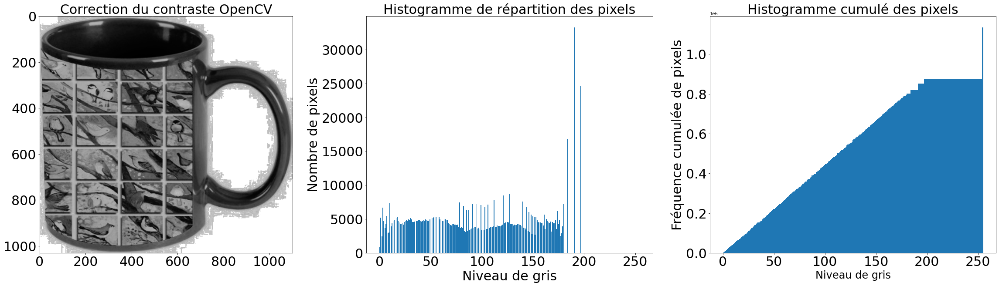

In [19]:
# Correction du contraste OpenCV méthode 1 : equalizeHist
img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
img_contr_opencv = cv2.equalizeHist(img_expo_gris)
outils_images.afficher_image_histopixel(img_contr_opencv,
                                        'Correction du contraste OpenCV')

**CLAHE** (Contrast Limited Adaptive Histogram Equalization) :
Dans ce cas, l'image est divisée en petits blocs appelés "tuiles" (tileSize est 8x8 par défaut dans OpenCV). Ensuite, chacun de ces blocs est égalisé en histogramme comme d'habitude. Ainsi, dans une petite zone, l'histogramme se limitera à une petite région (sauf s'il y a du bruit). Si le bruit est présent, il sera amplifié. Pour éviter cela, une limitation du contraste est appliquée. Si une case de l'histogramme est au-dessus de la limite de contraste spécifiée (par défaut 40 dans OpenCV), ces pixels sont coupés et distribués uniformément aux autres cases avant d'appliquer l'égalisation de l'histogramme. Après l'égalisation, l'interpolation bilinéaire est appliquée pour supprimer les artefacts sur les bords des tuiles.

[Source](https://docs.opencv.org/master/d5/daf/tutorial_py_histogram_equalization.html)

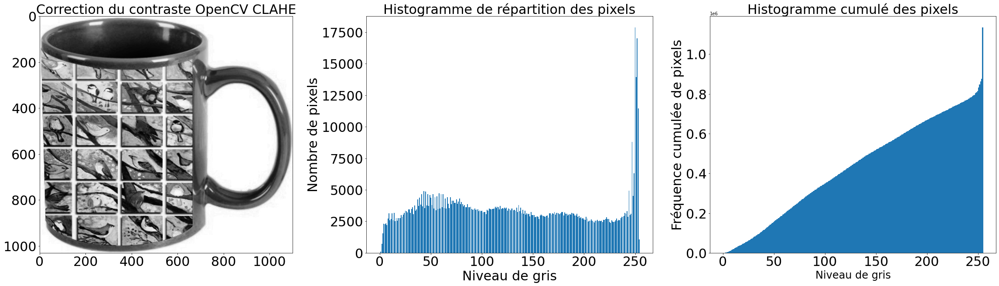

In [20]:
# Correction du contraste OpenCV méthode 2 : CLAHE
# img_expo_gris = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
img_contr_clahe = clahe.apply(img_expo_gris)
outils_images.afficher_image_histopixel(img_contr_clahe,
                                        'Correction du contraste OpenCV CLAHE')

**Bilan** :
- La correction du contraste OpenCV avec méthode CLAHE donne un histogramme cumulé plus régulier, il sera utilisé dans le cadre du pré-traitement sur toutes les images.

<span style='background:Moccasin'>**Redimensionnement en 224 * 224**</span>

- en entrées des réseaux de neurones, les images doivent avoir la taille  224 * 224.
- Les différentes interpolations : [Source](https://medium.com/@wenrudong/what-is-opencvs-inter-area-actually-doing-282a626a09b3)

***PILS***

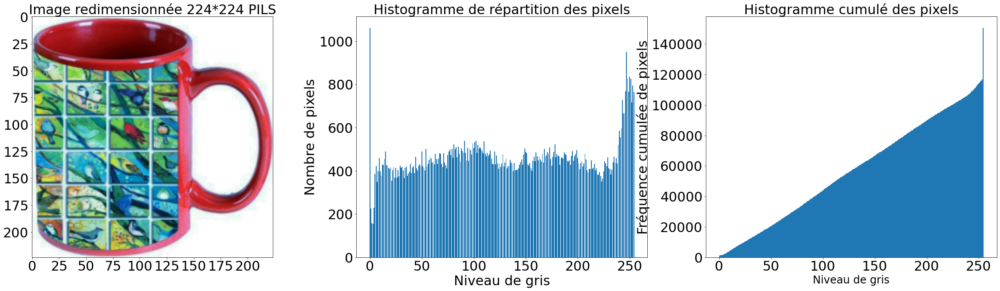

In [21]:
# Redimensionnement image contraste PILS
img_redim_pils = cv2.resize(np.array(img_contr_pils), dim,
                            interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_pils,
                                        'Image redimensionnée 224*224 PILS')

***OpenCV***

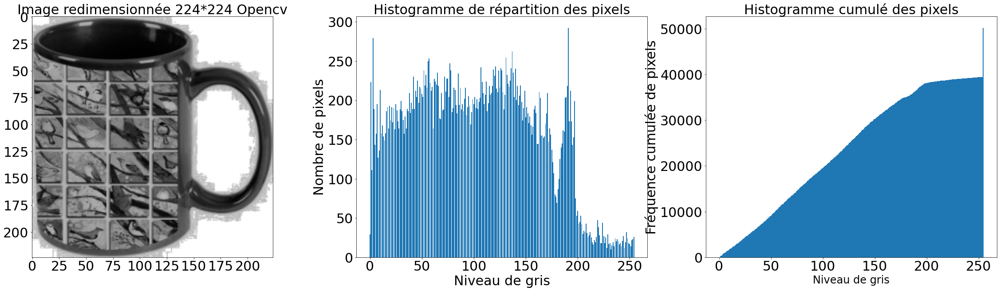

In [27]:
# Redimensionnement image contraste OpenCV
img_redim_opencv = cv2.resize(np.array(img_contr_opencv), dim,
                              interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_opencv,
                                        'Image redimensionnée 224*224 Opencv')

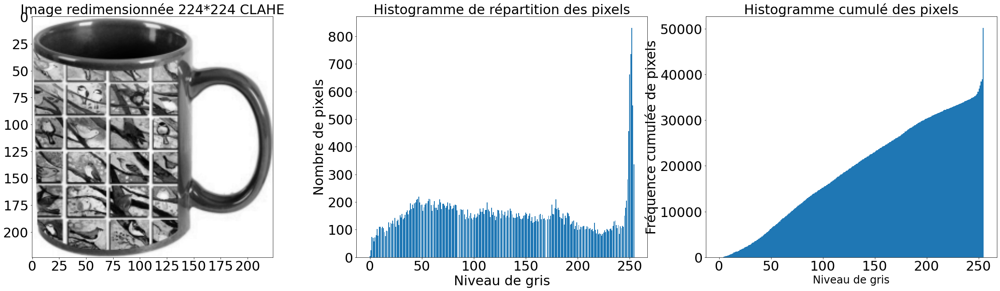

In [23]:
# Redimensionnement image contraste OpenCV CLAHE
img_redim_clahe = cv2.resize(np.array(img_contr_clahe), dim,
                             interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_clahe,
                                        'Image redimensionnée 224*224 CLAHE')

In [ ]:
# Redimensionnement image contraste OpenCV CLAHE
img_redim_clahe2 = cv2.resize(np.array(img_contr_clahe), dim,
                             interpolation=cv2.INTER_AREA)
outils_images.afficher_image_histopixel(img_redim_clahe2,
                                        'Image redimensionnée 224*224 CLAHE')

<span style='background:Moccasin'>**Convertir l'image en niveau de gris**</span>

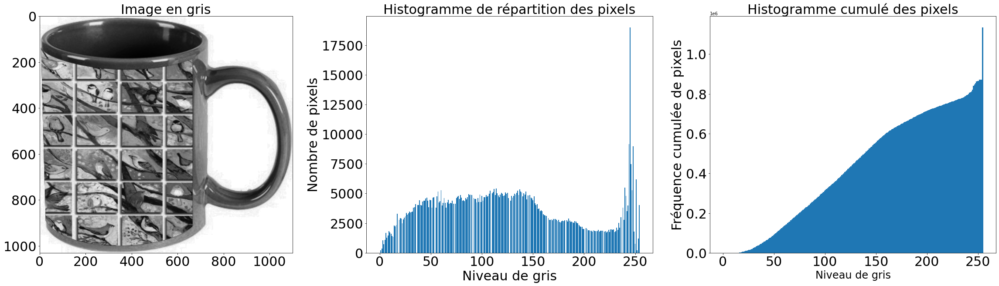

In [32]:
# Conversion de l'image en niveau de gris pour SIFT
img_gris = cv2.cvtColor(np.array(img_contr_pils), cv2.COLOR_RGB2GRAY)
outils_images.afficher_image_histopixel(img_gris,
                                        'Image en gris')

<span style='background:Moccasin'>**Réduction du bruit**</span>

- On observe l'apparition d'un bruit qui se rapproche du gaussien : apparition de carré gris.
- Pour améliorer la qualité des images, 3 filtres différents seront testés :
    - un **filtre gaussien**filtre linéaire dont les éléments du noyau de convolution sont déterminés selon la densité d'une loi gaussienne centrée à 2 dimensions),
    - un **iltre par lissage par moyennage** la valeur de chaque pixel est remplacée par la moyenne de son voisinage),
    - ou un **filtre par lissage médian** (la valeur de chaque pixel est remplacée par la médiane de son voisinage).
    - ou avec un algorithme **Non-local Means Denoising**  [Source](https://docs.opencv.org/master/d5/d69/tutorial_py_non_local_means.html)

***Réduction du bruit par un filtre gaussien***

***PILS***

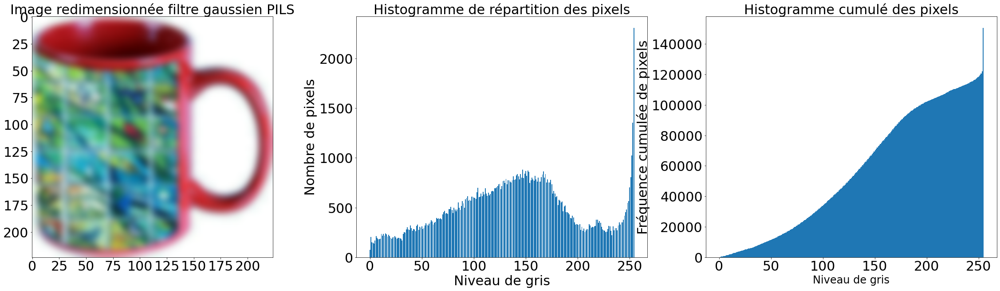

In [51]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_redim_pils_rgb = Image.fromarray(img_redim_pils, 'RGB')
img_gaus_pils = img_redim_pils_rgb.filter(ImageFilter.GaussianBlur(radius=3))
outils_images.\
    afficher_image_histopixel(img_gaus_pils,
                              'Image redimensionnée filtre gaussien PILS')

***OpenCV***

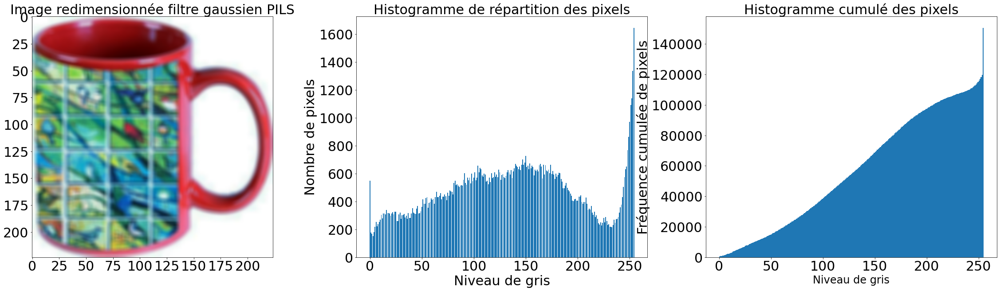

In [39]:
# Réduction du bruit filtre gaussien sur image correction contraste PILS
img_gaus_pils = cv2.GaussianBlur(img_redim_pils, (5, 5), cv2.BORDER_DEFAULT)
outils_images.\
    afficher_image_histopixel(img_gaus_pils,
                              'Image redimensionnée filtre gaussien OpenCV 1')

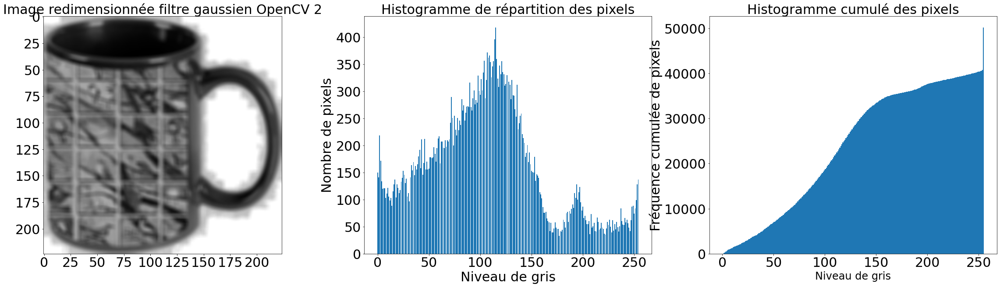

In [41]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_opencv = cv2.GaussianBlur(img_redim_opencv, (5, 5),
                                   cv2.BORDER_DEFAULT)
outils_images. \
    afficher_image_histopixel(img_gaus_opencv,
                              'Image redimensionnée filtre gaussien OpenCV 2')

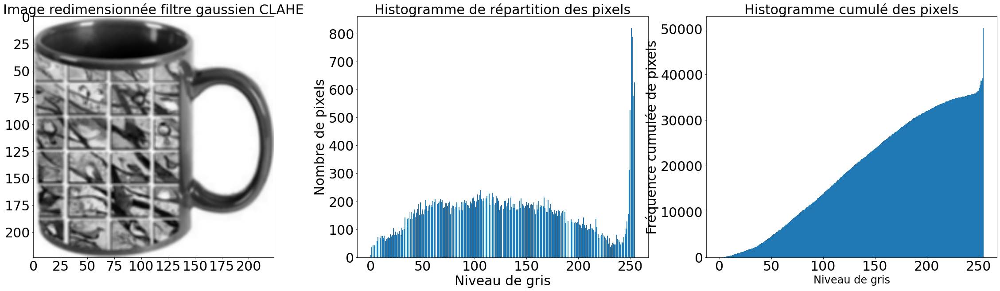

In [42]:
# Réduction du bruit filtre gaussien sur image correction contraste OpenCV
img_gaus_clahe = cv2.GaussianBlur(img_redim_clahe, (3, 3), cv2.BORDER_DEFAULT)
outils_images. \
    afficher_image_histopixel(img_gaus_clahe,
                              'Image redimensionnée filtre gaussien CLAHE')

***Scipy***

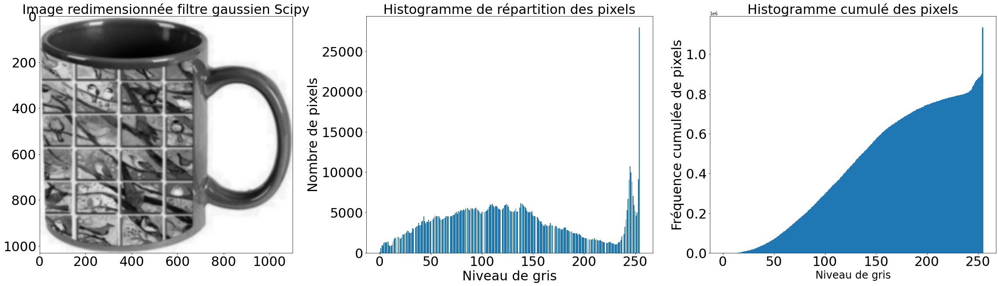

In [46]:
img_gaus_scipy = gaussian_filter(img_gris, sigma=3)
outils_images. \
    afficher_image_histopixel(img_gaus_scipy,
                              'Image redimensionnée filtre gaussien Scipy')

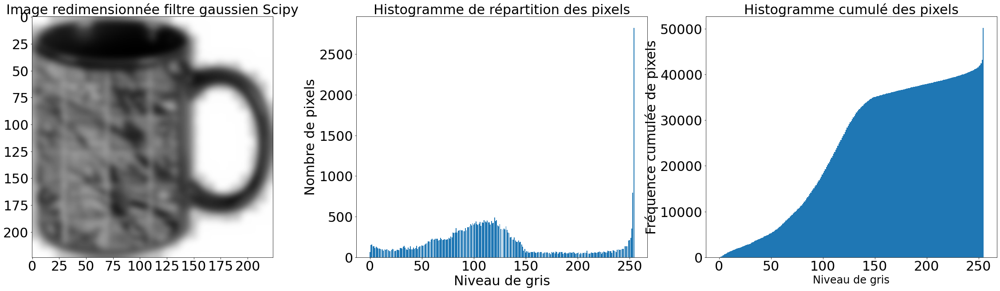

In [47]:
img_gaus_scipy2 = gaussian_filter(img_redim_opencv, sigma=3)
outils_images. \
    afficher_image_histopixel(img_gaus_scipy2,
                              'Image redimensionnée filtre gaussien Scipy')

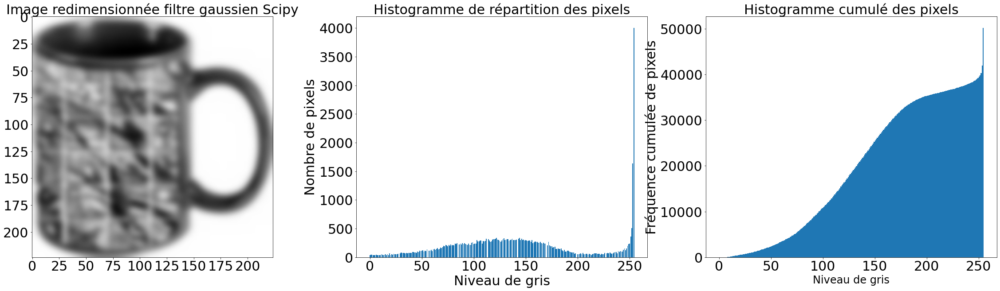

In [48]:
img_gaus_scipy2 = gaussian_filter(img_redim_clahe, sigma=3)
outils_images. \
    afficher_image_histopixel(img_gaus_scipy2,
                              'Image redimensionnée filtre gaussien Scipy')

***Réduction du bruit par un filtre médian***

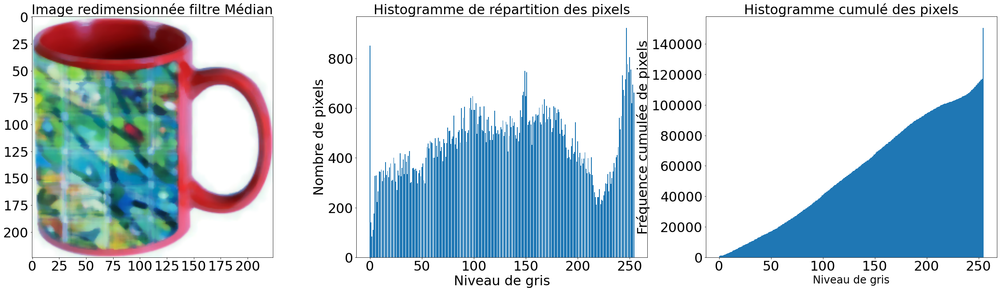

In [52]:
# Réduction du bruit filtre médian sur image correction contraste OpenCV
img_redim_pils_rgb = Image.fromarray(img_redim_pils, 'RGB')
img_median = img_redim_pils_rgb.filter(ImageFilter.MedianFilter(size=7))
outils_images. \
    afficher_image_histopixel(img_median,
                              'Image redimensionnée filtre Médian')

***Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV***

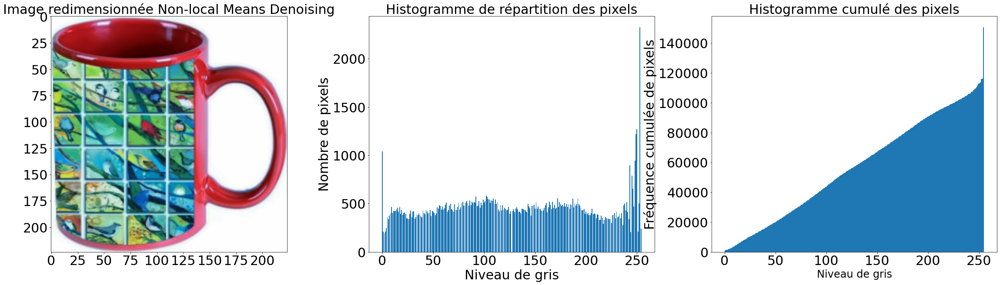

In [73]:
# Réduction du bruit avec l'algorithme  Non-local Means Denoising d'OpenCV
img_fast_pils = cv2.fastNlMeansDenoisingColored(img_redim_pils, None, 5, 5, 7,
                                                21)
outils_images. \
    afficher_image_histopixel(img_fast_pils,
                              'Image redimensionnée Non-local Means Denoising')

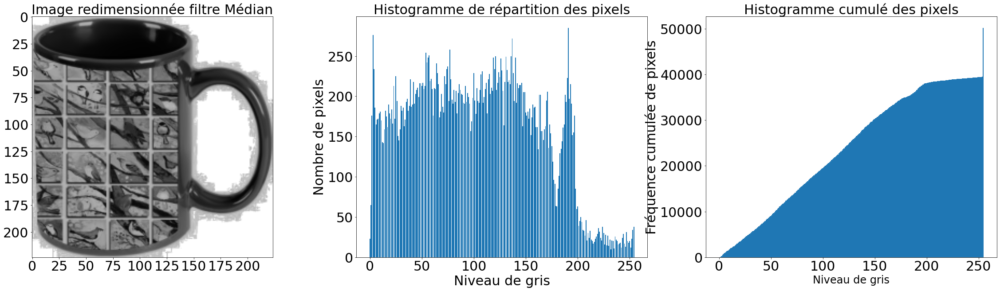

In [76]:
# Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
img_fast_opencv = cv2.fastNlMeansDenoising(img_redim_opencv, None, 5, 7, 21)
outils_images. \
    afficher_image_histopixel(img_fast_opencv,
                              'Image redimensionnée Non-local Means Denoising')

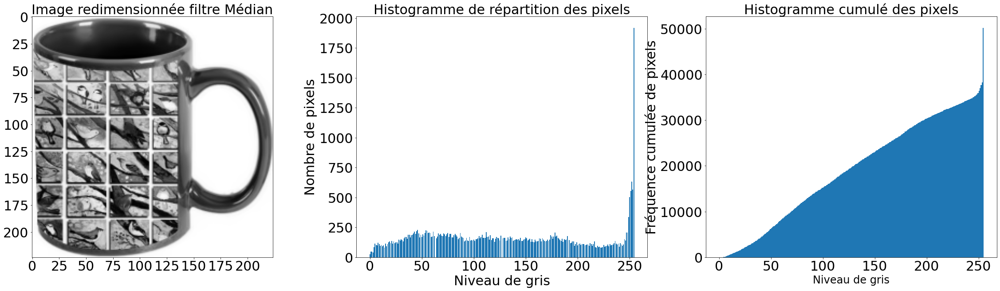

In [77]:
# Réduction du bruit filtre gaussien avec l'algorithme
# Non-local Means Denoising d'OpenCV
img_fast_clahe = cv2.fastNlMeansDenoising(img_redim_clahe, None, 5, 7, 21)
outils_images. \
    afficher_image_histopixel(img_fast_clahe,
                              'Image redimensionnée Non-local Means Denoising')

**Bilan** :
- La réduction du bruit avec l'agorithme Non-local Means Denoising d'OpenCV donne un histogramme cumulé plus régulier, il sera utilisé dans le cadre du pré-traitement sur toutes les images.

<span style='background:Moccasin'>**Bilan des différents tests**</span>

Suite aux différents tests réalisés avec les librairies PILS, OpenCv et Scipy, le pré-traitement suivant sera appliqué sur toutes les images :
- [x] Correction de l'exposition (étirement d'histogramme) avec PILS (autocontrast).
- [x] Correction du contraste (égalisation d'histogramme) avec OpenCV (CLAHE (Contrast Limited Adaptive Histogram Equalization).
- [x] Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV.
- [x] Conversion en niveau de gris de l'image (ORB, SIFT...).
- [x] Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA).

In [84]:
# Pré-traitement de toutes les images
data['image_proces'] = \
    data['image_loc'].apply(outils_images.preprocess_image)

Un autre test sera effectuée avec toutes les corrections avec la librairie OpenCV pour comparaison :
- [x] Conversion en niveau de gris de l'image (ORB, SIFT..., cvtColor).
- [x] Réduction du bruit avec le filtre GaussianBlur.
- [x] Correction du contraste (égalisation d'histogramme avec equalizeHist).
- [x] Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA).

In [14]:
# Pré-traitement de toutes les images PILS/OPENCV
data['image_proces2'] = \
    data['image_loc'].apply(outils_images.process_image_opencv)

<span style='background:Moccasin'>**Processus pour classer les images ?**</span>

Il est temps de classifier ces images en utilisant différents algorithmes SIFT, ORB et SURF.
Mais comment procéder ?
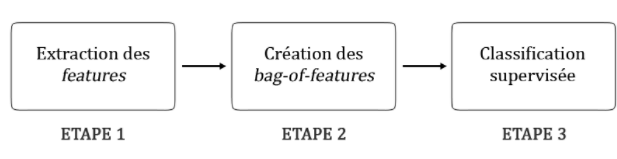
- La technique de **BOVW** sacs de mots visuels permet, pour chaque image, de noter les éléments les plus importants qui se détachent de l'image. Ces éléments sont les **features ou zones d'intérêt ou points clés**.
- A chaque feature est associé un vecteur qui décrit le voisinage de la feature à laquelle il est associé, ce sont les **descripteurs**.
- Un algorithme non supervisé permet de regrouper les éléments similaires des descripteurs dans des clusters. Chaque cluster contient des bouts d'images similaires présentent dans différentes images. Elles sont donc assimilables à des mots dans un texte d'où le nom de 'mot visuel'.
- Les images contiennent des proportions différentes de ces mots visuels, ce qui permet de trouver une similitude entre les images ayant des proportions de ces mots visuels proches.


## <span style='background:Thistle'>4. Features extraction</span>

### <span style='background:PowderBlue'>4.1. Algorithme SIFT</span>

- SIFT (Scale Invariant Feature Transform),  cette méthode, développée en 1999 et très populaire dans le domaine de la vision par ordinateur, permet d'extraire des features (ou points d'intérêt) de l'image et de calculer leurs descripteurs. 
- L'algorithme SIFT se divise en plusieurs étapes :
    - Détection : création de l'espace des échelles, calcul des "DoG" (Différence of Gaussian), localisation des points d'intérêt.
    - Description : assignation d'orientation, création des descripteurs.
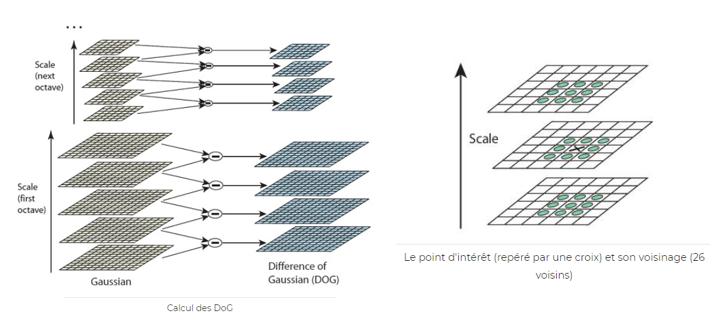    
- Les méthodes utilisées pour l'algorithme SIFT sont extraites d'OpenCV.

[Source](https://docs.opencv.org/3.4.9/d5/d3c/classcv_1_1xfeatures2d_1_1SIFT.html)

### <span style='background:Moccasin'>4.1.1. Exemple sur une image</span>

<span style='background:PaleGreen'>**Chargement de l'image exemple pré-traitée**</span>

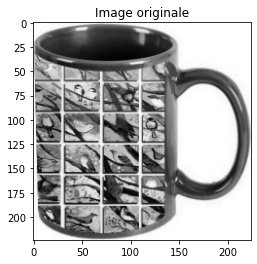

In [8]:
# Chargement de l'image précédemment traitée
mug = cv2.imread('data/Images_process/3c4ca34c50a5437a1bcc42b72fc1351f.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(mug)
plt.show()

<span style='background:PaleGreen'>**Extraction des features - BOVW - Bags of Visual WOrds**</span>

In [15]:
# Transformation del'image en matrice de pixels pour OpenCV
mug = np.array(mug)
# Instanciation de SIFT
sift = cv2.xfeatures2d.SIFT_create()
# Extraction des points d'intérêt et des descripteurs
sift_keypoints, sift_descripteurs = sift.detectAndCompute(mug, None)
nb_feat = sift_descripteurs.shape[0]
nb_desc = sift_descripteurs.shape[1]
print(f'SIFT Mug - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

SIFT Mug - Nombre de features=556 pour 128 descripteurs


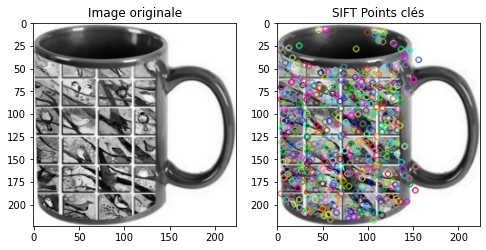

In [21]:
# Visualisation des points d'intérêt
sift_mug_keypoints = cv2.drawKeypoints(mug, sift_keypoints, None)

plt.figure(figsize=(8, 4))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(mug)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(sift_mug_keypoints)
plt.title('SIFT Points clés')
plt.show()

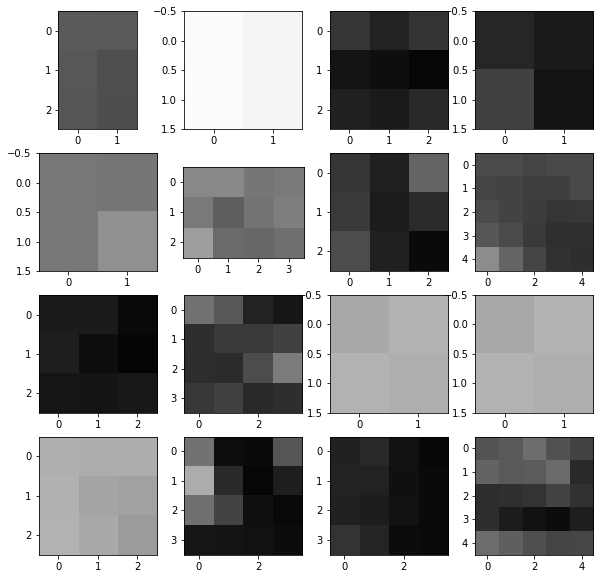

In [22]:
# Visualisation des 'Visual words'
outils_images.afficher_visual_words(mug, sift_keypoints)

### <span style='background:Moccasin'>4.1.2. SIFT pour les 1050 images du jeu de données</span>

[Source](https://medium.com/@aybukeyalcinerr/bag-of-visual-words-bovw-db9500331b2f)

**ÉTAPE 0 - Chargement des images pré-traitées**

In [30]:
# Impossible de passer dans la bibliothèque personnelle :
# erreur Win267 nom de répertoire invalide
def charger_image_repertoire(repertoire):
    # Chargement des images pré-traitées
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv2.imread(path, 0)
        images[filename] = img
    return images

In [31]:
# Chargement des images pré-traitées dans le dictionnaire images
dico_images = charger_image_repertoire('data/Images_process')
print(f'{len(dico_images)} images chargées')

1050 images chargées


**ÉTAPE 1 - Extraction des features - Visual Words**

In [32]:
sifts = outils_images.sift_extraire_features(dico_images)

In [43]:
# Liste des descripteurs = tous les 'visual words' de toutes les images
sift_list_descripteurs = sifts[0]
len(sift_list_descripteurs)

334110

In [45]:
# Liste des vecteurs par images (dictionnaires clé=nom_image, vecteur)
sift_all_bovw_features = sifts[1]
len(sift_all_bovw_features)

1050

In [48]:
# Sauvegarde des descripteurs SIFT
with open('sauvegarde/sift_list_descripteurs.pickle', 'wb') as f:
    pickle.dump(sift_list_descripteurs, f, pickle.HIGHEST_PROTOCOL)

In [49]:
# Sauvegarde des vecteurs par images SIFT
with open('sauvegarde/sift_all_bovw_features.pickle', 'wb') as f:
    pickle.dump(sift_all_bovw_features, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Création du dictionnaire de visual words - BOVW - Bags of Visual Words**  

- Pour créer le "dictionnaire" de visual words, il suffit d'appliquer un algorithme de clustering aux descripteurs de features construits à l'étape 1, comme le k-means. 
- Les visual words correspondent alors aux centres des clusters trouvés.

In [35]:
# Initialisation du dataframe de sauvegarde des métriques kmeans
df_kmeans_metrics = pd.DataFrame({})

In [36]:
nb_clusters = [100, 300, 500, 1000, 2000, 3000, 4000, 5000]
df_kmeans_metrics = \
    outils_images.calcul_metrics_kmeans(sift_list_descripteurs,
                                        df_kmeans_metrics,
                                        'SIFT', seed, nb_clusters)

'Paramètre 100 terminé'

'Paramètre 300 terminé'

'Paramètre 500 terminé'

'Paramètre 1000 terminé'

'Paramètre 2000 terminé'

'Paramètre 3000 terminé'

'Paramètre 4000 terminé'

'Paramètre 5000 terminé'

In [37]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_kmeans_metrics, 'IMAGES_data_kmeans_metrics.csv')

**Méthode Elbow**

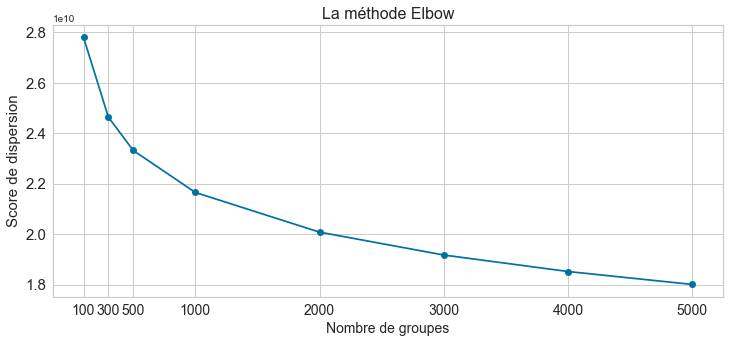

In [41]:
# Trace le graphique des dispersions, pour visualiser le coude
plt.figure(figsize=(12, 5))

plt.title('La méthode Elbow', fontsize=16)
plt.plot([i for i in nb_clusters],
         df_kmeans_metrics['dispersion'].to_list(),
         marker='o')
plt.grid(True)
plt.xlabel('Nombre de groupes', fontsize=14)
plt.ylabel('Score de dispersion', fontsize=15)
plt.xticks([i for i in nb_clusters], fontsize=14)
plt.yticks(fontsize=15)

plt.show()

**Bilan** :
- Le nombre de clusters (paramètre k de l'agorithme KMeans) utilisé sera : 1000.

In [50]:
# Constitution du dictionnaire de bag of words
sift_kmeans = KMeans(n_clusters=1000, n_init=10)
sift_kmeans.fit(sift_list_descripteurs)
sift_visual_words = sift_kmeans.cluster_centers_

In [51]:
# Sauvegarde du modèle KMeans Sift
with open('sauvegarde/sift_kmeans.pickle', 'wb') as f:
    pickle.dump(sift_kmeans, f, pickle.HIGHEST_PROTOCOL)

In [52]:
# Sauvegarde des VW SIFT
with open('sauvegarde/sift_visual_words.pickle', 'wb') as f:
    pickle.dump(sift_visual_words, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 4 - Construction de l'histogramme pour chaque image**  

In [53]:
sift_bovw = outils_images.image_class(sift_all_bovw_features,
                                      sift_visual_words)

'009099b1f6e1e8f893ec29a7023153c4.jpg'

'0096e89cc25a8b96fb9808716406fe94.jpg'

'00cbbc837d340fa163d11e169fbdb952.jpg'

'00d84a518e0550612fcfcba3b02b6255.jpg'

'00e966a5049a262cfc72e6bbf68b80e7.jpg'

'00ed03657cedbe4663eff2d7fa702a33.jpg'

'01089dc3618a0ab7304d784ef400b83d.jpg'

'0131e5d87b72877702d536299cf83b75.jpg'

'020d2daba55a723128e4e07c0b0393a9.jpg'

'02127f52e96fb72c66bf081d25104ef8.jpg'

'025a85a3d1cddc6307f7dc075d8d2132.jpg'

'02a53d335775b652f22f41b529b9d646.jpg'

'02c63a087b298ec74042d557acf61be1.jpg'

'031c98cfde349d99fb6d5983f54c8751.jpg'

'032e812adcd11a38fd8b764891a852ff.jpg'

'037b39bef3db7ccd264c577a0edf0c0a.jpg'

'037c2402fee39fbc80433935711d1383.jpg'

'04f9f818e2d657b873b07578cfe2eade.jpg'

'04f9ff160a1561e3656350f4bd6b8c50.jpg'

'050ea3acb555bf641e7ae9b4f3ba684a.jpg'

'052559ede419996737893eb47568ee7f.jpg'

'057836ecde71565f8ebdd576e41fdc96.jpg'

'059493eeb88ebb4cc08d1522f3f87c3f.jpg'

'059bc43e03e1824a9ab6466e32e5f137.jpg'

'06749cbff1487f470438823f6952cfd1.jpg'

'06b8da0c6a24b91c8020f8b1c78d04c3.jpg'

'06fdaa2b03d70da4358311d260456729.jpg'

'078b35be31e8ac99b0cbb817dab4c23f.jpg'

'07912328f580cf080d721e6466287896.jpg'

'079d049de21fb2426b516a8d2f9a8bdb.jpg'

'07f8bdc4372a73d0820507683a936b6e.jpg'

'08452abdadb3db1e686b94a9c52fc7b6.jpg'

'08613e8b27838b997069b1fedb6e88d2.jpg'

'087e83a2406dc98d941b8555356da477.jpg'

'08bdf59c9dcb241e3a57eb4f3729ec70.jpg'

'08e8af585235d7403ca2b7b56a51a6d4.jpg'

'0906fd9cc604fbba05a502e01d763cd9.jpg'

'093097cfe5626f4ad8914e0a16a940b5.jpg'

'093bcad64d11c0aed903a8dd787ef069.jpg'

'0991e8d8f884003ab18890971191085d.jpg'

'09f9f9b420edea2f39c0dc3c24d5be07.jpg'

'0a3b5fdf77a361c2d7d9b29c259b8c4e.jpg'

'0a8a1e9c6659361c0c2b247f8a6471d0.jpg'

'0abfcbe0e17dd50c4cf5fb1d6037d514.jpg'

'0ae859a69c7608d8197c3ba8c37bc6ec.jpg'

'0b793c1727ef52285a25dedf8b86626b.jpg'

'0b852704f2002f8865a68818ad4951da.jpg'

'0b8c4bc35aee94af356cb1fd2dfa0219.jpg'

'0bb0f7b7a3075f4b9459121abe2185fa.jpg'

'0bff0eda7a6677dc1acb0477a1f7a121.jpg'

'0c4718ae90f2889b7021a99ee1cc106c.jpg'

'0c70a580d96e50966130e2885d8c3505.jpg'

'0ca8e323551dd7107ef57ef7c3e77aee.jpg'

'0d02f4703fde00645704e15bba23e77d.jpg'

'0d3e1dc0d38be59e9927e47f152e48aa.jpg'

'0dc4d2767fe8424a3263ab141884f83d.jpg'

'0ddc40c08d9a9bafc4d14eddd98db7c0.jpg'

'0e1e3861d54a8a17b7b91f04071a4ca3.jpg'

'0e73201f6d8807776e1d21c969078289.jpg'

'0ec47240feda42c63e42f1e9cee60f7a.jpg'

'0f4f761de4224b004402c1f97e871ba4.jpg'

'0f7a56876c61ba98dfed48ede5d3f3e1.jpg'

'109e235d4838002246599f987d935c21.jpg'

'10ad262ebfdc8614e847d36e6fe9ecf9.jpg'

'10b6738d7058738a9a7d107bbb2833f4.jpg'

'1120bc768623572513df956172ffefeb.jpg'

'112a8a56ee40ee31ea06fb7ff23b5c25.jpg'

'113783ce1db999778b5a4bd374e61209.jpg'

'11502f02601ff063bf7db0a618354652.jpg'

'118b411bf265538461b084ce7abd55a8.jpg'

'11f06dffebf7edf9e15351834a190c2c.jpg'

'1218fd9be42d45a81846db9f65a983bd.jpg'

'1357e9d24661c3b5797aa1016e0c3be1.jpg'

'13596c5cc53a74268613e5c0b7d46b60.jpg'

'136f213080426c35520f1b1540c4a390.jpg'

'13de17e59a92f8bcaec8bf103bbff8c1.jpg'

'141ab1fbe0f943463d4971098647000c.jpg'

'141d2b743c477043041faddf9233c8ad.jpg'

'142994b421c052a6193052c6c8c3d076.jpg'

'144a5e05bd6e69535c53366a805a8b5f.jpg'

'146b0d570d5ab4e27629d48533b7680d.jpg'

'14826adf9bc4c34ea566dae3d85ef7cf.jpg'

'14bc693d9b86c58696e5917045e9d4de.jpg'

'154920adb9d584b55d419227f9b01cc6.jpg'

'156bcd3aba1838a2b6bad856654db964.jpg'

'159b45e4dede207f28319bf1cacee3bc.jpg'

'15a0364d0efc54d4e272a49f85b149fc.jpg'

'15f45d08050e8ba24a14804cba000589.jpg'

'168618e93387ad7171d4e4e1eeff9d1a.jpg'

'16c18ce0affca13159e362227c83683c.jpg'

'170fdf050c7a1f8d30ef5a98c4216f9c.jpg'

'1738ddb8f47f11ff0cb96fe6cad302c2.jpg'

'17582ae953860b5320683768b8e97d3a.jpg'

'17611e6e94d73ef376834e5c6ee03dde.jpg'

'17a73d7c4b02ada2bfeed1115fed08a4.jpg'

'184ecf07ca4e2872eaf53d2344a1e783.jpg'

'189fa66a5fa6f08d2802a62ecf0be298.jpg'

'18bd9b88e23b82fd19f8ab0c9cad6a1a.jpg'

'1971dcd2f3058a4c87bdd7d87d4baeba.jpg'

'198dbe7be6f84f6448197148d7b5e5a5.jpg'

'19a570b6717955a8c48e5f280617ef24.jpg'

'19d2dbc1789653c58bce08c169662cf2.jpg'

'1afa5f2c3c9b4b43def6dc2e695d2c87.jpg'

'1be8161a259813bca5d068d5730464e7.jpg'

'1c0fdd598671f6f4e10b21435d766cf3.jpg'

'1d1be744e491ed61e705c20e4a72320d.jpg'

'1d829e0eac91d7e85cdd6d581c363360.jpg'

'1dbe1f3ba28460dffef4a1d664549621.jpg'

'1e15dbd9f59a8b2001f91d18ddc84b5a.jpg'

'1e8741b5ae27a513546c94b3f3312aee.jpg'

'1eda39f01d0a8a2e5ce4b32fc7da1027.jpg'

'1fb0fc88acf0dc6ab9528c26252447e6.jpg'

'1fcff864d6e397e1424d5366e6c6b8fa.jpg'

'202fc276e672eb8c29891aa50aef0771.jpg'

'209bf06a732416f1ce5147a8b0524808.jpg'

'20a06aad5f04727dd54bf13dd5923518.jpg'

'2110699b945ae766c8b8112038ac58b9.jpg'

'215decf6f993d7b45d75520d9174493f.jpg'

'216c6c3527984be3d7ad9023d5cd9bd1.jpg'

'219b24362655097cb41bf06a0be8ee79.jpg'

'22146eaca9aee0223a4302d87cb3e122.jpg'

'22296bfc1c79d9dc88eabbd01220ef0c.jpg'

'2231a6fc63274c46043e353f1728f077.jpg'

'227fc5c4fca14c424ff33e40941d22fa.jpg'

'22ac36ba254a68d7dd6173f099771147.jpg'

'22ea3b69860bc9a5e0c69b87db2dcdab.jpg'

'235410c63d373e2fe141c129de2f624f.jpg'

'23704dd51c975e845c574b044aae0a9f.jpg'

'23b0bdd337f7d1b4b70ad13726a122ab.jpg'

'2414e4b7e5948263b8dbb4843557be4d.jpg'

'2476ae5a5e045876aa08f5919cb3b91b.jpg'

'24e85c590481a7cedfe66597f253f2b2.jpg'

'2541b59d54a3a9f2681c0049f7ddd85c.jpg'

'2580f7559802e4e5e3695fda6cbfc317.jpg'

'258444ac7bb7ad8026800efad5c3502b.jpg'

'25ce025c38c55f28fd0ea3bb0200df79.jpg'

'260c74b5a09272dec1a8207db3541a0d.jpg'

'26269fd0df12630eec4508c2cf3c94e1.jpg'

'2651ce313a5a3aedb7c566394a3b3b26.jpg'

'2670ba9bc61b42937773486ddcae442a.jpg'

'26989e846c2096a5b59b59cbea2cc7ab.jpg'

'26d8d458084ef90d395d303eaeb71587.jpg'

'27175ea71cc5f2879882c77b9931cf8b.jpg'

'273982a65b9c7dabe56c8345552bfad7.jpg'

'27b7851ae3dfc2ae8c1958cebe93bf0b.jpg'

'281dfd9b94b34362c295b3e5f8da5dfa.jpg'

'282102897daa1c2513cf76837a8d5a4c.jpg'

'283e2c4d728bdb193834d876ec27e6dd.jpg'

'28401ff0dbc191d34c2f1103e78e082a.jpg'

'285075cfac3036e8d51591dfe5ba24ab.jpg'

'28e3f1e490cfc4b47bfb50671ff93283.jpg'

'291d5ff1e50dac3058cf10578f692085.jpg'

'294a26262643797cb07f72f1b55262ae.jpg'

'2971287a1ac427bd98c4778112d20d06.jpg'

'29b1ca231e10d5269516b80bf9d0dffc.jpg'

'29d7a1b4d4f658fc3082905f65e1b009.jpg'

'29def171d7e31d48571a52f0fb3e6b07.jpg'

'2a20862f02555a44b0ab301bed987a0b.jpg'

'2aaa6083689193df5ab01fe37dea1b5e.jpg'

'2abb35d6affd2796e664349a747bd302.jpg'

'2b278ad355318a87c336285689d214f0.jpg'

'2baa415ebcc4fe563ce13b50e60efc1c.jpg'

'2bf0ca6d25501c067cd12a2a4939443f.jpg'

'2bf95e5f8c4d7d0126de92e476d4fc8b.jpg'

'2c475daafe597ed93c1e27fcaa38d8cc.jpg'

'2c8912b849cf73676d025aa99203b6d1.jpg'

'2cbad7ead8eb8dd92823b9f525c87b9c.jpg'

'2cc24452688ed35dfbff566e22e53c95.jpg'

'2d4f1232af970bd19881ceacad6ccfe3.jpg'

'2d50e4c6ccf8befe9335ac8f97a11712.jpg'

'2e3586dc60df258c5478446d65a317d2.jpg'

'2e474c49a7dfe704c35cf3990740daa3.jpg'

'2e8df36b35d22cf219cf8bae6c2af752.jpg'

'2eb07dc77e2fc7e3668fd7ed9b864039.jpg'

'2ede595489db33a036d135ce22645515.jpg'

'2f40e01331bc00216d147d4ebfdfbaf3.jpg'

'2f712e172ee77a913b6d627657986b72.jpg'

'2f756aa2ceb1efda609c428a47308758.jpg'

'302c95f6eae5f4ce217fcedc4ef91262.jpg'

'30305ade337a4dde171afb90141bcaaa.jpg'

'30ab693b54e99a469a1152b5db14aa40.jpg'

'30ad2acaccdd2e1691a61c44079c2b5a.jpg'

'3113367c72125a3355af42426fe14f17.jpg'

'31376e77d4621c06a45440d42b9fe2ac.jpg'

'31ac1b66cc6bb396c83f124317589f8c.jpg'

'320833ab08c9a94ef83520612899a85f.jpg'

'321f2ab0dd243778c87ac63ace6639f4.jpg'

'328b66226952d8733c0c48295fae1108.jpg'

'32cf0691248297655e2c1728b12e2262.jpg'

'32da1bbf4f523bc8a8735701ce4b7726.jpg'

'32f24a4303050f500dec7cb3608fe089.jpg'

'336fc49639a5cc45aa532ace3ee1a044.jpg'

'3388d05e88972ff9f3e1321dc0cfdc28.jpg'

'33d97d63c037078cd3f08033966d6a88.jpg'

'34d3b2b8d263294107a3ffc69b35ff8f.jpg'

'353ddb2c8ab6920d8ad1055abee87dda.jpg'

'357432a848c3f13fa614efe5dddd99b6.jpg'

'3589e80e8f7f3f3a5b65447389b90c2e.jpg'

'35a68b44bef47a809314493d28535b9d.jpg'

'35b5dfdda9214c94ab15bf5390e07de9.jpg'

'362714cbba2f5ae412d2f26bae99a266.jpg'

'3693c4e7f7efb47edb3d9eec067ffd93.jpg'

'36b965559aa2b97cb961a603f18a9183.jpg'

'374e63028d691c380bc43b0dc60e460d.jpg'

'378d7dbdb97ecc62c9ad52cb6df23a86.jpg'

'379ebeb2ad76333ab67afe292688512d.jpg'

'3830dda3491cd5b28ed42ae544bc44f0.jpg'

'3847353a4b8de1efc504d589aea74ffe.jpg'

'3864ab10ef7006452fef45513de8f868.jpg'

'38782cce965307ddcdbedfcb7fa409c3.jpg'

'387ecd9ec173d61b6dc5ceddc079b150.jpg'

'389197b67a189c703f3deb9ca6f1f678.jpg'

'39242e5488cf65d8d59eccb2b80e4a65.jpg'

'3945cc3920106c04648e8ba17ef2b009.jpg'

'394c2c627914e1eed9b8ac343583a679.jpg'

'3a7b224bf1bc9cee9052f9c9df0355f6.jpg'

'3aaa50eb5d2cf4c18b57346423871624.jpg'

'3adb36e4275733d0d113d9039e6814ea.jpg'

'3b0f02b3acf1825f8bbc1fb3b860dbb8.jpg'

'3b465b02720ef7c930cb2e065a8fc05d.jpg'

'3b80ac036843b278083fabfd9a3c84ff.jpg'

'3b96a152c8fac4421fb67b6190584976.jpg'

'3ba13df7877fd979d64c87c7586a5ca6.jpg'

'3bc98543c7dd0d8fce5b8185b4a58c43.jpg'

'3bf09b28e3bf526c2dfebfe591921103.jpg'

'3c4604dba348a99a2dfbbc2cd3928101.jpg'

'3c4ca34c50a5437a1bcc42b72fc1351f.jpg'

'3c74db45cbfc14a78b8466dca494b3bb.jpg'

'3ccceaae844f34180708cb6cba3441bf.jpg'

'3cdfd9df09f61a8fd178bafcc8dbed31.jpg'

'3d8222014ec36292c1c143c5f5e12c29.jpg'

'3ddd2f062730c2aea8bb8843d5a96125.jpg'

'3dfd14b667357e26ff6d66761cdc203f.jpg'

'3dfdf277bccb74532c0387adfed2897d.jpg'

'3e2b2a04696f7d83a7835e9894d79df7.jpg'

'3ee79b1e51c9f9262e8373ce6b717606.jpg'

'3f025b9dc8065fe5a155573e5b21a70d.jpg'

'3f97735a6c61a3587cefceaef36c280c.jpg'

'3f9c4d0e8c3bca9c870e41f5098f90d6.jpg'

'3f9f12fa8fc6d7ebef136040f179a201.jpg'

'3fa21f35257649e1513ca4ce22c6a68c.jpg'

'3fd4d7ea04624ada39fde3957c7b9b7c.jpg'

'4019ad332ca3ce22449ff54fdd49a273.jpg'

'40829ac110f344ef35f1c8c32fb311c7.jpg'

'40d7d3d1961236dd814e15592fa52994.jpg'

'40efb9474b44fba54b5d2a8df121d727.jpg'

'412d0425bb7076610aace6549ded265c.jpg'

'41384da51732c0b4df3de8f395714fbb.jpg'

'414d2065e1aed847064bcf14538eabc8.jpg'

'417ae3e8b08acc19a023b8a958644799.jpg'

'41ae5a7304f3dc1dc8bc2dfc7765ae4d.jpg'

'41dccf212ff447cd7213a2b1e669e406.jpg'

'41fd5af61752be98b19b611a6ff9a0ef.jpg'

'42643c1c9403f67921a18654bcf45ead.jpg'

'42770faa04bfcf2b62e7ef335e1b1965.jpg'

'42a8fef62716772c391fbdd148cc9c16.jpg'

'42c5c528ad7ac8ad7a4e7c31f958e25f.jpg'

'4354b7418ee0fab2fd9f8eb493556529.jpg'

'43da6e88dcb61e027ea9112cfab158ee.jpg'

'43f4a023dd92830ab5b26886c496f23e.jpg'

'44218245b37581c534038cc27d081093.jpg'

'4451f1b01168b6a085738d0b0f2f02aa.jpg'

'44a6d9f64668b004c3254f3904142064.jpg'

'44b963eb856b4831dfdd21b666593c95.jpg'

'45204a03550940bdcbc8e4703c07f550.jpg'

'456ec612b30d4b091639843cdb66bf54.jpg'

'4589c5021b21525b4779260f7e86f355.jpg'

'458c697fe5824552890b0e674cf5c109.jpg'

'45d0af2c709de47268c80c35a117de44.jpg'

'463492671c5c19316a0fb9fe1c53da48.jpg'

'4642d967bc34a36454b281de632f6c11.jpg'

'4676a8f96abb86c5d1dc5b06c7a11d95.jpg'

'46c7cb82a768ad8811db821d8649f6e0.jpg'

'46ca672fdfff8a1b3641642a9795344a.jpg'

'46e6853da6b0c796b7a0d8203ceaa88e.jpg'

'470ff3c4e22d237f5a75ac07225e513e.jpg'

'4735953b9c8504eb327675a14c6c33dd.jpg'

'473b1ab1abe21826c41efa1584a88a63.jpg'

'4748b7ea0e01cffa561f1a7a7a432813.jpg'

'4788f5466992da09024b8ffcc8a5cba4.jpg'

'47d7792e50e69b048b1f17176f170141.jpg'

'480d24adbc304a52a4e01e45bf8bbccc.jpg'

'486e98154514ed485f0b2f9bc9f24549.jpg'

'48b9e7f78348b95955d7484910b7af15.jpg'

'493d1eb6ad7a48a926092bf994cd0bb0.jpg'

'4942e0a9c0527dc00319a39fc8f103e6.jpg'

'4946e2411d24801b9e8f7dbe97ab1b93.jpg'

'49658948b5f4eb06a3ddc2fa75eb41d0.jpg'

'49852d7f69839e0b1006adc55d56938a.jpg'

'49f7763dc9c7ece284a1ae27166f8c6c.jpg'

'4a1b23dacd7d2a9ec7414f7159f25a48.jpg'

'4a4ccd1ac291cfc8b3894e691a1c0f7a.jpg'

'4aa047f14885c74f155ce5f973e14dff.jpg'

'4b03cdfc7d1135c972e5c620dd7da66c.jpg'

'4b0e6f200426b1db8824b2ca0c59ecfa.jpg'

'4b500e244f11a45f5171bd3665413044.jpg'

'4b59516432fbc3d61e8e58d547fde431.jpg'

'4b8728226cc2934095782f7e7f3ce740.jpg'

'4c096ad79f63c12a42f56fe8cec37f36.jpg'

'4c449766e715bc41023244c9042e0a82.jpg'

'4cc971d2c9c0f1056bc124031ed52c1e.jpg'

'4d2e9f36823bad0f6fe8c6b19bb92bdb.jpg'

'4d638f7a608a76db27cd7bab13582a93.jpg'

'4d6bf06ef01f80130a1ab28dfdeb7aa3.jpg'

'4e03d4e81e6a876f512536f6a57c053e.jpg'

'4e09d5a71d46d61de3d4c9c5aedb73f2.jpg'

'4e130ed339dcfe20d2c8b66892278a94.jpg'

'4e57e21d903b752a6b5aa496a43f1590.jpg'

'4e5ebfc871992e7e22365c0c036a1b89.jpg'

'4f6006b716c6546033fbaf9ff32de577.jpg'

'4f708bc74c4d29b2967dc38a1f5ae6d5.jpg'

'4f8f64f93f789af51bb07296639acbd2.jpg'

'4fe24e100a5fcc33cf6054ef101067ed.jpg'

'503bb08f7bdf6a395ec564dd1dc83619.jpg'

'50be4cd92fda2755e1e884421a52e345.jpg'

'5188dd28a627807407d93549580afb74.jpg'

'51b6809d527ea36798bddc2bb8557bc2.jpg'

'51c9062e6538c787b14a75a6a7cb7fb3.jpg'

'51dc964c7a47293ff0ed0c6912813722.jpg'

'51eb5d22eda4be2a409a336651c50bb1.jpg'

'521528ccaa29dd645e869550cae7a249.jpg'

'526cb1e7675adb39a1ea68f1f2a3fd59.jpg'

'52877a6306aef18af67ab54c8233c931.jpg'

'52a8d66e466da645e413d2cecc294bd9.jpg'

'52c5fe837181962a7c1d5883bb9d7007.jpg'

'5307e0db12b1018746ac3801d189c379.jpg'

'5321f76936848ccc0003f6c11e923fb5.jpg'

'5325213d84c80ad310b6e4b37a1ac824.jpg'

'532fd66d24261d77d9d8b18cfd1ca0f2.jpg'

'5338c00e0ddaec0f3af737077e0bbd91.jpg'

'534d9c3ae2342df2f4f9233622f90711.jpg'

'539f82930cfad8afef1a75882eb45703.jpg'

'53b9357d16d4db0a1f9ec4e8ac91e743.jpg'

'53c4f1e5cb1767f1a6ba05d32dfaf107.jpg'

'53f4bc7d7321f5c41de6b86e41f13e80.jpg'

'54749618b728306f9b3dc518dec315ee.jpg'

'54754ccd18f2a75c53de68806176392a.jpg'

'5479bb7028827d60000720a2c135976a.jpg'

'5518124b75d6c6dfee4c2e4c0cfa716a.jpg'

'55195de3873fffaa9e37b041533d7305.jpg'

'5531b9f454e2d75cfe00c3f795e06de5.jpg'

'553aa0252537751d153e7c50029f0242.jpg'

'55b85ea15a1536d46b7190ad6fff8ce7.jpg'

'55ce1309b69e1912d2fd60a3ee3f351b.jpg'

'568f331e1039bf2e0635b899c2b3248f.jpg'

'5749bae8ccead7997ebf370b6b081d07.jpg'

'57578c1e6ec61a880a6f3f971f5f77b8.jpg'

'57800d48b001f3fad34a4f8fa9207f29.jpg'

'58d7fbbe6d306ecf16e0a7ac05b211d4.jpg'

'5912e037d12774bb73a2048f35a00009.jpg'

'59247d4024d85bfaf9e48368cba6d870.jpg'

'595f508cdfbfa162d0fe7b97cc99ef42.jpg'

'597a9549a3e397d52dca62ee47b1f60a.jpg'

'59af3731b809a25f2bf99e99f645d8dd.jpg'

'59d964c38c787f829c6cfa5629e4df90.jpg'

'5a54c78b52c984e56500809e5bc27ae1.jpg'

'5a5bb03499009f35759258263fc834a3.jpg'

'5a7a1287fef0d986a5e237797beee286.jpg'

'5aacf8f5154afea2ac22fc767d072677.jpg'

'5ae4626271e8eefe5eb2aaf42c00724f.jpg'

'5b378b0925d5409b5d84ceb416fc2afc.jpg'

'5bc04e6a0b6256dc78bb9cb22b39ef41.jpg'

'5be86e35f21b1514d0e7742893d6cfba.jpg'

'5c0fe2919e49f30aff91d46800cdf149.jpg'

'5c6b9db55291a68d99c4bb9a88266e27.jpg'

'5c77aa1fc09901ae07c392c152a70e41.jpg'

'5c7b493625b5fc6689cae49d25e1ae17.jpg'

'5cd3d274d71e1e0d6bf075421461b2d5.jpg'

'5db6bd89da44841c1a5b686e67137704.jpg'

'5dbf978ab2cf9d2da6446d3e4595f690.jpg'

'5df72b5295dc5e6126693e640b50f3a2.jpg'

'5e52d6ce133e5307814f9f3eedc5806d.jpg'

'5e84d36ad6db970548498829db8b15de.jpg'

'5ea8ddb8a5104c5d47c708e8a351e701.jpg'

'5eec66ec172ce096cd4e5c947686b56a.jpg'

'5f8ebf77ba4064b68ea23a41cda71d97.jpg'

'5fdb912462da9891e5b21c677ceb15e4.jpg'

'601817defaff9d0e30e1b72f96d3975f.jpg'

'60395c709b4a933319e2713e3ae620d4.jpg'

'6057d1b6682ab473a3fe2ca8b4577259.jpg'

'607dc41467008ee7a8dba0276f180f63.jpg'

'60a7313ea1e0ee8d845a0a6dec6117cc.jpg'

'60efd61370e70267dc60b11ff2bf974c.jpg'

'6136976dc5a433cdf8e2559b8510bdce.jpg'

'614dbfa2f42c4684c0bb6152091113a6.jpg'

'61c0139f3d5c97f1615797dbf046cc0c.jpg'

'621a88993a7033df3440ec816c2e386f.jpg'

'62a1044ba64031b9e40f98a4fb890d9d.jpg'

'62c35de4df27437d3597963fac55a8b6.jpg'

'62cbea6012792cdbe5ff7cac2a6b76d0.jpg'

'62e36e018c9ee4b282cf674e84054df8.jpg'

'6325b6870c54cd47be6ebfbffa620ec7.jpg'

'6325bf868b9040a0599f257aba42e9e0.jpg'

'6329ddb46087cb8c09ced95471dd9643.jpg'

'634c89325a6c7752985a74a67f985c1f.jpg'

'63523a600ab69f276664d0eade9d076e.jpg'

'63bc43c0000e71eb11bfafd2f46214a4.jpg'

'63f2d92a3f5fc6cfc11e7f99d5798eac.jpg'

'63f6ef8f3fda2c306b27cfbf5a005f1e.jpg'

'640fd08bb3ba538d67a5c0c2c61a5c4c.jpg'

'64247967cbf6cd8bb2e243ac53aa5928.jpg'

'648b52926285610670a756923b8a6f99.jpg'

'64a9d0488652194fd8e879d5e6dc8015.jpg'

'64b463dc0b75ae40a848498c657041e6.jpg'

'64d5d4a258243731dc7bbb1eef49ad74.jpg'

'650e27dff8f645649353743f64e03f77.jpg'

'653826cd53f1d9e2c086c0ac7846ef70.jpg'

'66191b4a311b5d9babfc00a71ef97c5b.jpg'

'6634de7b39a5b0658c74ab098450096d.jpg'

'66a5a21ea332aefcc7b90dbad94053aa.jpg'

'66b75f053cb7626f49f1a9bffe77b451.jpg'

'66d91765da568f133f040b951f25e702.jpg'

'67119571e4b46deb266236d8e7fad65d.jpg'

'672d1c3272eae4586eb5994fe408c12a.jpg'

'6775e3b91baa4d368f6d91eb7c24578b.jpg'

'6776795cc4521a0cb0d54059649f7d72.jpg'

'678ebb5f6057dcc51948253c1b39b0b8.jpg'

'67d6b4a8aa19d57740b0440365b77624.jpg'

'6858fd9265d348803b18667fe43cd054.jpg'

'688bb32bf0d9b6e350d2c0912a3b7c9f.jpg'

'68b32e026c109c1bae017d024dd8f590.jpg'

'69446af66066146718cd569f87e99fff.jpg'

'69515ea06da8b2b1c881ce34fbf6575a.jpg'

'697ad1d2e45c1af54cab7847cbe324d8.jpg'

'6a1afb657e9ac01e3ca1956dfdcc3e9a.jpg'

'6acca991d2353781779b866e4f96edd9.jpg'

'6ae332e2bafd23267caedfcc4453257c.jpg'

'6b043b37c38f081d96886acb5acfbdf5.jpg'

'6b04c746cac2aa811d7a8753e54dc96e.jpg'

'6b5cdfe68595fbcab0e05dc625d3d66a.jpg'

'6bc04b3ec1f8d4da2a00f8662f4fbed3.jpg'

'6c3768639e82ceaeab681e083b897672.jpg'

'6c441a6ca8eb4e5ca882c9c0df03ff0c.jpg'

'6c53dbd7a9d43744920bfae3bc06327f.jpg'

'6c8f99e979d4de9ab5d1ad20455622c7.jpg'

'6d460d2e12ff7c84cb6b9af783d465ae.jpg'

'6da53319cc12c9729881f5478ff67223.jpg'

'6e44d107ee32412243b19b0ed9b415f3.jpg'

'6e6694c52c9273cde2163d34d5b44e94.jpg'

'6e7cc21610991cab64595af678e8eb5a.jpg'

'6e812fbc03331ab363789b0f2d6b3ff2.jpg'

'6eaa9bd9e9285d77891bb76d30e6ebe7.jpg'

'6eabdbbbffdfae86c3c5177ba0f96ea7.jpg'

'6ed34e1ab886e8a702ec59dd66ba4dff.jpg'

'6ed4eb71c0707f1d6fdddcf62562cb02.jpg'

'6efd5d260667b94f04edbbd18bb300b9.jpg'

'6f9c169adda9b562a841a9cf54b16f06.jpg'

'700dfd088162ea00deda33123cd7f2da.jpg'

'7037dbd17682322c89bdf7203b403381.jpg'

'70461caa9038cfa34d109ea056d57f5a.jpg'

'70578f48cc96bbb60d040e08025e521d.jpg'

'705b90361aeda1849a728d80625a78a9.jpg'

'707b160df4c4dece6cde52b222ce624b.jpg'

'7091af252a785131c5a124fb90705fda.jpg'

'70af4c3c05688d8400632e134f258b98.jpg'

'70d571a25d37e16d5d5f4e94faccf454.jpg'

'710ed5f2393a4b9e8823aa0029f71f93.jpg'

'719677b02bfccafb86e9be78f36f938b.jpg'

'71ff6abd7764f2a42fcbefc11429be2d.jpg'

'721c1b67f86176f741d43cae1d1c7e93.jpg'

'721d6fc10f52e76007c3c0405cf967c5.jpg'

'723e472f98180745980efe32411d30c6.jpg'

'7241df1acae1fac892c692097ea3fb98.jpg'

'724e6eb7edc83eb48b6492d12e940ebd.jpg'

'7264f56639c8c54158b94ced769082c8.jpg'

'726de30d1473ecb9641c1cd5286b6344.jpg'

'729864e0d25e06cbf68561529bcdd4f0.jpg'

'72cbc043d14ee578c789c9fab3c43cdd.jpg'

'72db37ec42ee76d79cf395221e0f4cce.jpg'

'733aa1e801a139fa8dc7be9f0eff5ee0.jpg'

'73503fe89ea77420a598f4a1019e5b6d.jpg'

'73523a8cc9a5c04a010d0307f2f2827a.jpg'

'735820e1614052fde55659da9dc10ccc.jpg'

'736191946aaeaa637a0865a42c18b580.jpg'

'73901494efea71869576898c68b5eee4.jpg'

'73b692cdfce9a77b721a54d4b7fb35a7.jpg'

'73f460cd6f3fd206902d7097a1816405.jpg'

'7436c011ebdfd24b56a77893f210ed3b.jpg'

'747b170919791d6111847d3485b5b77b.jpg'

'74e5a3f6edb34d7e593a0d1854b0b886.jpg'

'75015382e469d36e397c5b47ea613314.jpg'

'750f964cf8e6a16412aaf2b0d0350d0a.jpg'

'75549ef6adc47e9b6dc2b69f530d9097.jpg'

'7616c21074fe889defce033dcd0d7cb6.jpg'

'762b6b22cccf91935e92446efe298fe3.jpg'

'7680c6bf930669dc0646e3315187dc8c.jpg'

'7729e54756a60aecb2067a747c890913.jpg'

'77f659d4d18381c991fb9210e05d9c1b.jpg'

'7815fb39feb773db944c9f03bbdcbf64.jpg'

'7821fb1cbf8d3bb294c3c20527119f15.jpg'

'785b4383b12106dd172306d427d8f7b2.jpg'

'788dc3a3da91c0f46a7c465e07f91dd4.jpg'

'789cf5578f48577a44586fca3adc35d0.jpg'

'78fcb634d9838127464d827234ab05ad.jpg'

'7915f1c0703450d4b1446c06066d9a59.jpg'

'7956d9586de3e25ff586bca58be7195e.jpg'

'797bb7813ec0bbc99e8b6f1b32c32e52.jpg'

'797d10fe966b3aa35933669c3425525b.jpg'

'798346b99002495667bb87626d33b99c.jpg'

'799ddb97164ff2d5d53bb8b27b8c355f.jpg'

'79b78739b0ae84780001fec304ce036c.jpg'

'79e6b64a09ec7d393be193430ea732fe.jpg'

'7a3f11f380a1bf85338ab3771ff81e9f.jpg'

'7b1c5edc85bc7e31edf49ab70034bb3a.jpg'

'7b1dd192151777c246a1c4e1fe0ddb4c.jpg'

'7b72c92c2f6c40268628ec5f14c6d590.jpg'

'7ba69836467fe0795bf0e1161fc481d9.jpg'

'7bbcbd91b8865a9f7b254760e5e2e10a.jpg'

'7bcabeb38f148041087fafdad40e2c57.jpg'

'7c15895bbfd7da97c219be5b28150a06.jpg'

'7c333641c63bd7519432ae83744b8db4.jpg'

'7c4c57dda1b2e50f40b331cc8f9d233b.jpg'

'7c4fec2331da8d40f2cb146eb198cb57.jpg'

'7c785e9e26092c0b6ed038085e90d89d.jpg'

'7cb1ea7b2257aeeeba701a8f6e3e0127.jpg'

'7cbbe686c4a233e8cf53528748f75223.jpg'

'7cdc62f8d3f7ab8b9d2dddc14c86de83.jpg'

'7cf36a3f1f2bd785954cc876a941da40.jpg'

'7d2883d833e215d3092c7f53572f870d.jpg'

'7d99ac27ad194bc62000c46779c42732.jpg'

'7dd5e83e2108a97659577e50879f9d9f.jpg'

'7e11aaffb1d08f8091ea94598f7865aa.jpg'

'7e3d8e737aec8f1eca019302593c732e.jpg'

'7e4c1d31e279a700c6b8e66d820e8601.jpg'

'7e6ae1b372e8e0b509b83ba3658b8107.jpg'

'7ec5ac2dea80b6c5e4cfd20eba597d20.jpg'

'7ee2e665b7de2e1cc29e3c65bde0c318.jpg'

'7f2f1f3039d1f5bc23226fc36577eab9.jpg'

'7f6678a6217c831b716feca796f689fd.jpg'

'7f7c64d439d64656d6baa40f5798cdf5.jpg'

'7fd12776e6d62da6e1dd3cbc9882ee5f.jpg'

'7fd3f7b35e8b4a66432c974c8cb5c46d.jpg'

'8015db34d09642b046c775e8157dd729.jpg'

'8026dc3e27e8e318cc7431a723f7ebc1.jpg'

'8050d31bffe6827c804b8222338aafb2.jpg'

'80e9cb3d2d7f9ff7bc497c34df366d03.jpg'

'812bfd40e47dfde2ff5326e899b42577.jpg'

'8141b9d5af35017a907b1e88c17f7963.jpg'

'81a695f80d3f5c445910d310f1a83eb8.jpg'

'81e739c7f3be737152f2e6f520e3494b.jpg'

'82466269245f199d7f850509307a497b.jpg'

'8284c10b2890ed53e17de5cfc33cdb96.jpg'

'82fbc93cd45ab747e7e606f2c52c7335.jpg'

'832a66ce379b4c98fd3d748eebd7ae4c.jpg'

'833a87b0af3b84fe246d2ebf271af177.jpg'

'8396537a124f502d11ab99972c816129.jpg'

'83b7c331ebdd018bea7cecb6171eda96.jpg'

'83cef279f0ea5d772523d0d8b2923fbe.jpg'

'841b14271aa4c29f291f600c9556145c.jpg'

'84b2e623a4a4327b88f7fe197a09be31.jpg'

'8507eb0ef32c1c0db700f20aad6d9bcd.jpg'

'85aec4bf3185da7ebcc45003429cbfe2.jpg'

'85fe188e1ee8237b70df0d475907bf24.jpg'

'86089ddd9f9e52127ce838f210f776d7.jpg'

'862c7462f12de819d93f93dc573289c5.jpg'

'86a39f77de21aa9654e8ea03335244fc.jpg'

'86b358a265312c139e5714e663daff05.jpg'

'86dcb7d4ce6ec7bfb3e26d1bd859f4fb.jpg'

'8720a25546a572b0217817a82bfd00a5.jpg'

'873a955df5a2f677a41a7efc94060e41.jpg'

'8748b6cd9f03afc539f246c55e230502.jpg'

'87e0ba259a84a10580bd659466e73e23.jpg'

'87f1807e002d3555b8dfb465a8a61df2.jpg'

'87f256eeace1a0c2b1f934f061646da5.jpg'

'8818424349b75a67775353d1feef2635.jpg'

'884ff6050ff3d6b2c8f681c300a21b2a.jpg'

'88650de379b6ecb085ecb3c2e6b42d4c.jpg'

'8872dd7ca802f56c1c3ee07e22e84cfd.jpg'

'8876d7569efdaff5a21b33a1ab44a13d.jpg'

'88ca277594f22bb7494f2d0bbc51f8ba.jpg'

'8932c9a89b487bf9f2b3fce06c7c6553.jpg'

'893aa5ed55f7cff2eccea7758d7a86bd.jpg'

'894904e26516d491bf1c7711fe800e78.jpg'

'8962b50b699ddf4712ad18d29c6a3862.jpg'

'8963e56482bbd3e9d05e0709d61ee0ca.jpg'

'89b95537d8697203ab278237289a52a8.jpg'

'8a15fa23b8c39ac1c7eaac94cbbe6fc6.jpg'

'8a184fe2c82ba6a17fbe07f94d0dd875.jpg'

'8a306758531cffad41e7a28e41576c49.jpg'

'8aa19c1f26ee1f256d4c3ab5f2f849be.jpg'

'8b268c1e68f198ae2e934717d49f48e9.jpg'

'8b7a51c69b47f4714b5f7131077b5d30.jpg'

'8bf65b132179faf26f61e26274b2b819.jpg'

'8c62cbbd23958ae380fea906f6b5a994.jpg'

'8c6942026d53b881d1da9359ea19c9fc.jpg'

'8c81ed9792bee1c2d6c3b8289d80eece.jpg'

'8c90f3ca64ea1a8ce104c3c3f5fc173f.jpg'

'8ccc970bf4c55e9b2710d5319161c357.jpg'

'8d1abb3504a19ab41e7d8b8b1d5dd839.jpg'

'8e8f5dc78f80eff3c77a9714303f59d2.jpg'

'8e94fbcd81112a21860355b3b11cf52d.jpg'

'8e961e4fd248c9496ca54808d2d2b25f.jpg'

'8ec6ee9814a27423e66c3c9ea26f77aa.jpg'

'8ed6faebe087745cc1a3ed5aec2a57cf.jpg'

'8f41774c16a931d71fcf01f8fee171e0.jpg'

'8f41c6931b5220c2bb34d1cab21cb220.jpg'

'8fc61e0dae2460bc6e8f152283d20173.jpg'

'8ff973688c976a08fc7242da37101417.jpg'

'8fffcfe66dfde658580f98f6e28a6a46.jpg'

'903d63e2b71d692ccd628e1de516516e.jpg'

'90453db0386931707b256dfa1e32c404.jpg'

'9059227d71995f88a1f48ff63830f716.jpg'

'906b5b16c78ba1c718501138702cb32c.jpg'

'9077acd25761ea067ac6d9369d8fdf16.jpg'

'908cc351957d02f72f60916006c531ba.jpg'

'90906358dac904c4f05c12c798ac5221.jpg'

'90e56526f4c5892beac49f262b85150a.jpg'

'90f86ac4065397340e8012261577c220.jpg'

'911a6efe69bde398fbbddcb0b4bb466f.jpg'

'91795f4b0e4aac27314477a91b63bfb7.jpg'

'91a5328e7235424885d271dfa0959eeb.jpg'

'91e22428c0dd8871288ba5dac35a7382.jpg'

'920154acbe49d3202ed7d2ed2df1ea13.jpg'

'922a04084481d4b3275a3f7bb54e90f3.jpg'

'93618b8a998782d4d847ee5cba5c7de2.jpg'

'93f01d6cd167fa549928a9b649f87ccc.jpg'

'93f45475c82bdee6df73c6e08011b7da.jpg'

'9412b6fe7b97e405def91f24f064c547.jpg'

'9438a0874e0486f46f3669cac6c2ac90.jpg'

'948699ab8c947ce56c256f9cf7996761.jpg'

'94a0d2804a77f7d2bfab6f3f0ae5254d.jpg'

'952a100cf3a5bdf2d655e9cdca0e9dd5.jpg'

'95330f6f0f44d17b918feec36bedcdef.jpg'

'955abcd11312fce2fd02a91a9b05ae71.jpg'

'958f54f4c46b53c8a0a9b8167d9140bc.jpg'

'95b0779b1a04ab70d62c72b53090c4b3.jpg'

'95cb9561009bd6707c67f05e6a00c16e.jpg'

'95ea40dc6c0e81407e13d70bd52a5c95.jpg'

'95feec21a9d076cff084159d61bf9b8e.jpg'

'9613f2f1e65fb1fc7e181e7f83c217da.jpg'

'964648862f322b2cc153239af04b22ef.jpg'

'9656b0a52d364da5eed38a4bb2d9f6e5.jpg'

'967d91e162afb44a67c0281f71766e4d.jpg'

'968a2b3be84193e3f755c2fe71033a2c.jpg'

'96bc1fbb83ad5a2c0441d132fe8bcf97.jpg'

'9743e6d1c9f3180483825fe4d2e97836.jpg'

'97fba8a02361aa56eaa9fa51bc1d7661.jpg'

'9823c07cc256788556e424307f5ae9b6.jpg'

'9833d0de7f7e1927c807411c10b19189.jpg'

'984983d05e18e63d1a314e86cb362ae5.jpg'

'98659fb98a4fe903f21f5c315adbaede.jpg'

'987e13b445c34bfedb9796d2bb78d593.jpg'

'98ad5b99ad96695568d8f143b11ab740.jpg'

'9906d8f74589c452b00f2b5642a63c5f.jpg'

'9924fba9b2a738e5a141995952e73104.jpg'

'994f1d8ade16b9fddce3c127eb7f38ed.jpg'

'998a39dca0ef610c3a0ea4e9cc6e1681.jpg'

'9993de7e2bcced43dc9edb3b2c81f23d.jpg'

'99b5905a1079edc2744b06a4049719e0.jpg'

'9a02f44389bda4c60e7dc23947dbca58.jpg'

'9a0413117aa91c668ba5944770347cc5.jpg'

'9a3cdc88ebbba7612e88eac1b82c5f82.jpg'

'9a8fa4fd6524ada03411b033a9daadc1.jpg'

'9a9402ad55d079c86c302521816b7b0e.jpg'

'9a993e1b59649c93f667d38227325066.jpg'

'9b00cab981ab825158c05c9e54b866d4.jpg'

'9b805665a791f40e7946a73dcea17e35.jpg'

'9b9fc81808086cfd1ce5a2b46e2f9926.jpg'

'9ba898ecb77ab5a6799c8b047c6b6008.jpg'

'9bd8526e99697998cdf7dcbdfa044847.jpg'

'9c06a95a82c3bd6635b9fe6e92b15902.jpg'

'9c41f67773da27940d77460715e880be.jpg'

'9c4ab8ab059c912090c83cb0818e7f1c.jpg'

'9c8fdf6c9c631d0892e9a6f55a4a2fd2.jpg'

'9c9385abdb73ec1f1f93acaf81c6e1d7.jpg'

'9cd443dad2c8f354fd01869a57fdc171.jpg'

'9d20743a61f62fe6f9cdc5ff24d46d23.jpg'

'9d279c825ba12804c337f883b366a6e2.jpg'

'9d2d833bf63095902417c2a35f72432a.jpg'

'9d3ca83f7017d6e9e129964e88503ff0.jpg'

'9da942796e9fac272db50b2f7546b94a.jpg'

'9dc48a756ba86bbf6934ec6ddf9da03d.jpg'

'9e07a3eeee6aa9e656106281cdd30d67.jpg'

'9e81a24714e06b0ca9b4fed8cae42611.jpg'

'9e90fb6c7870637b6f794e4b4c26bd7e.jpg'

'9ec6285cc619688d787d641cb87c10d6.jpg'

'9f141b3c3d9096f5a897d01b48e3b360.jpg'

'9f76aaed44b540869da862c5dd4b266f.jpg'

'9f9bb0ef3bb8af571bcfbfa1a22150bd.jpg'

'9fb8662af03c957ade34d4c816d4e903.jpg'

'9ff54c12cc7ffd7c1a6724477b8fea2f.jpg'

'a0133654f3911e47f021da4e49d42926.jpg'

'a060b5acc6e3fb814769805db61f589b.jpg'

'a11773bc4188f1c6226b941ec61c2024.jpg'

'a124d6e4c30b00918c594289266a383c.jpg'

'a12d9ae5720ae41446e084911f0c2865.jpg'

'a18d4ddb1a1c3463d6719e526573c4ba.jpg'

'a1a266a37d38f7ce41d11f1868d8c9bf.jpg'

'a1fa0e24b2249ffa81f688c4840f1eb8.jpg'

'a1fd886094826c3f25c6ffb380073974.jpg'

'a231459c1562ee1117e95a61128820b7.jpg'

'a30aa3b765b613c158fd3a295ed934fa.jpg'

'a341f915962ee99754e962520f279708.jpg'

'a371cfcae8c6ec3b82ae37a83a8ae9b9.jpg'

'a378736c1510a13966b42c2d6462f526.jpg'

'a3dea07b2f7bf48276d32513091be717.jpg'

'a41371b2f8859b015031f0d5eda5184c.jpg'

'a43fbae655e5d13215b9dd65339fa9d4.jpg'

'a445d1f73be8f81dd902fd5dc8529416.jpg'

'a4951eb41979fe482879f777c8f21d2b.jpg'

'a4b09aa7927c59fbb39960b3d7919909.jpg'

'a4d9e71172f619f8e3122e34bb0bf3cc.jpg'

'a51b2c34b3d5a6e5d0591ee6e0b4d335.jpg'

'a541b3aba326d7749b4c086c3cea9273.jpg'

'a54b94096938252901d3f7f8de97bffb.jpg'

'a554abb9699959ec78425eac2b997c27.jpg'

'a5e1b49a1ddf038888e6de3523b475fb.jpg'

'a618354ba17cff64826558d81afc77ab.jpg'

'a63eecfbb02004863fa1f29a0b8105fc.jpg'

'a66a68fbed935f90b62d5d29003267fc.jpg'

'a67d4b8df18ac476cd1b0bbd80e589a4.jpg'

'a6c820b76bc29bbe2d85eecad3de03f8.jpg'

'a70ea60f971825b2eb57261029f317ec.jpg'

'a76bf8400b3dbcdbe5a5678f4a8ea0f6.jpg'

'a79117ea49a0533f641facdb4c99f502.jpg'

'a7a294ddbcd9bbbc46c034079529c17c.jpg'

'a7bd63ef1d3b345d7f9a162865bb7c0d.jpg'

'a85a7dbd31267a7b02eda3a4d484632d.jpg'

'a863d956964ed41b7c90f5138dc69db5.jpg'

'a898bd6978f9f2c6aa940b9fa3352c27.jpg'

'a8e2698d5bd4347f8136c86104ae03e3.jpg'

'a8ea6fc2b3cd95f46bced80853ce8e0e.jpg'

'a97b85d31d715c65b2970c4177eb0fda.jpg'

'a9b35b94610a3d7f4fa91f19693c5248.jpg'

'aa41433dfba2c7561fa30be3fed1e8f0.jpg'

'aa68675f50a0551b8dadb954017a50a1.jpg'

'aa82b75da7579007963e53b6f818281b.jpg'

'aab46b84f70cc6774afaafe1d6035de3.jpg'

'aadbc3b9c32c4535b1bfee7321c4c0e7.jpg'

'ab3f4b2d2ec007b7e0eaec213bfdbffc.jpg'

'aba92798c4b2723e23131478d6c97293.jpg'

'ac209ee3c602efed4ff093854a4ade06.jpg'

'acd2f21d63ac0bbed4d52e6010d9460b.jpg'

'ace154420a51fad090b3543995630051.jpg'

'ad08a6efe82576ab162a9336feff647f.jpg'

'ad55b7ac6f7284b90d31a1a2f175df8d.jpg'

'ae03731c3482a5e42d040dbf723c49af.jpg'

'ae19a81b730b48b87ca72521af8fb902.jpg'

'ae45b64d808a883aa35f2bf4de879cac.jpg'

'aeb421e416716d5f037d50e8c3b14cd7.jpg'

'aebf3a2172b33ef09acb472009967812.jpg'

'af13232271963742c118a1c58affa259.jpg'

'af1ac46194b5488048c459102a16a57e.jpg'

'afc3ebd18df498dd87abb7ad7536b5c7.jpg'

'afc829d45be38102afaa20f4bce2f627.jpg'

'b0229d4466ac60c7ba53c7ce9fabad7c.jpg'

'b144a363c107c7bdd91f32d6e28ba6f2.jpg'

'b1644f47c7dfa58f8c06677f2a27ee09.jpg'

'b17d093c269db6ad3bf4b6076461fd72.jpg'

'b19c9174113c2b9288157e14c48a8250.jpg'

'b1c7aa8e0f50e7ee73ed30d12af1a961.jpg'

'b1d61c60791a01827e3251e362c78573.jpg'

'b2e4a7feb6bbca9cca2c0c1e18acbcfc.jpg'

'b33d82c619bf88c3e3bb8f53beab0c4b.jpg'

'b362b56f7ee80dcfe9d8bb643df87007.jpg'

'b3e5f93856cce162850713bb8edce52a.jpg'

'b42a9b597a3a3dc8f428e2e2323e9aff.jpg'

'b4327c9879644be2a04e9b2df963f6cb.jpg'

'b454f9f449c9dff58b90113ba984ea98.jpg'

'b46d7b8e6826ad4c8b40a991da0f54d7.jpg'

'b48218a94e220c20373ed50dc4254093.jpg'

'b4ccd4c315d99edd7c00d015b714485a.jpg'

'b4d35b6536b623c83b293eb3a1c02bba.jpg'

'b4e829e38d69d299a923abf8d11ac18d.jpg'

'b515014adccb1fdf5ff1e2c4a8ff9ea6.jpg'

'b52073e7ed9c00c4108cae4eb0c49c1a.jpg'

'b551f20c6a8a1dc3d102a5f04bc8d7d6.jpg'

'b58309ed929c2bf7d6096c03667b654f.jpg'

'b5834f1e97c74d2833dbcb09a3f27926.jpg'

'b5aafdb7cfde56f3e9e1364eb1efb691.jpg'

'b5b47b2ecf5cf5760051b0a980ed7a3f.jpg'

'b5d1b8ef70b1ce27726f7f6c2f373e56.jpg'

'b64149a8a9235f5199c6d8225d5dc602.jpg'

'b6c339777814451815fe7950fd4c8536.jpg'

'b6c4cb6a29dcbaf7fa958f04c8215547.jpg'

'b7214d4c357e3f7acae72fcbe7d31afe.jpg'

'b78586222de9a1095d0a9d88455ee75f.jpg'

'b7e42b52534c5e49eb03817d754c2153.jpg'

'b7ef3e6ec248f17f3a6a4697120ddb96.jpg'

'b85f8843bb1c297dd5712f0bd287006d.jpg'

'b90046b67cafcedfd363afba5fafc1c7.jpg'

'b91b13aceec0a140944a2c8915e45e59.jpg'

'b92e13d5ef945d086fd4f42b95bc04ac.jpg'

'ba9f3a5ab1517a644322d856a7d25946.jpg'

'baa093d149982b010ab72ecbeec6110f.jpg'

'bb18279e9885136f1dbc8676d4af94e3.jpg'

'bba68d75eff1b7b5eef7f6c1c68f2227.jpg'

'bbb8cdc5406ff60ff06ff64630f2ca47.jpg'

'bc2aaae47829fd5825f6cc2ec51c2c5f.jpg'

'bc6b11881b783f275edd051431e531a8.jpg'

'bc784846bd59a16832454416ac708003.jpg'

'bcb51cec3d290e6a661586d0df30e091.jpg'

'bcb8e456728013a90ba66ab3b1b783ad.jpg'

'bd14484c68d8a2992a6fecad36bd9f37.jpg'

'bd2a71a635bf307de0056b74205918b7.jpg'

'bd95002e0fea67f7ec2f2597814c5eaf.jpg'

'bdcc7e18ffed5390cd3107030992ffa6.jpg'

'be09f5a3a88ac10ae14c791fc8ac0dae.jpg'

'be0e65c6d8c2cc8cb913b36aa4168cf0.jpg'

'be0f39341d771aac57084970f1ed6425.jpg'

'beaa6285a2b9c66db0e294767711ca3f.jpg'

'c063d07d78a55a21bf6c0e7c8ae46a6d.jpg'

'c0a7134d52d4aa3eb5874aef112f809f.jpg'

'c109187e7975ee8fdb2b3dfbdd9dce20.jpg'

'c12fd368ff03f5224b92771824cafb9c.jpg'

'c1e9b5875e442203073211c522072973.jpg'

'c205b200b10aab43be31df8fc1db6d86.jpg'

'c20bf28cd809790c04e78fdaf47c038f.jpg'

'c2e71e7c97489d4efa5eab796ae354ac.jpg'

'c2efa8aa11898bdb5fc4e46201973a42.jpg'

'c36ea960a14f164ee0f39ad6beb3796a.jpg'

'c38eb8abdaa1d8c28bc8c262761dfbc5.jpg'

'c3c23b5aa5e388e5f71883f61d1a0561.jpg'

'c3e1435782c0929327449eec11475b96.jpg'

'c3edc504d1b4f0ba6224fa53a43a7ad6.jpg'

'c417f408340252f170f05dadf88160d7.jpg'

'c44a5dc5b5ebe5b3e0535b7c2b7921e4.jpg'

'c4581cae6bf751a7ae5c40bb16b74e98.jpg'

'c4ac93e194281d6d1450ffdaa52f5f99.jpg'

'c5590e238d44b370337624f5987fb9b8.jpg'

'c5720509a67da707afcb6f4f0282d529.jpg'

'c5c559012b742d9966df82182b90c6da.jpg'

'c612bdfa459e1e2f20d57348336c24be.jpg'

'c65fa0b38ab99792630468bd7dd26416.jpg'

'c6adf41cd378b1f6a7ac62675b060411.jpg'

'c6cd71c28144224b080cdec222bc4833.jpg'

'c6f4475e2385cc16ce83f21f975614b3.jpg'

'c705a5735a94aeee547d1798e3e46ec4.jpg'

'c7207128c680a437e1cad834a8880007.jpg'

'c75d6d827876b0d0127acb59e5a251ee.jpg'

'c7d81193e868b50355412ced7a67f8f3.jpg'

'c7fcd0d983a51283e58b806f065cc920.jpg'

'c8c7385b1b9589f009aa836f0590e646.jpg'

'c8e2c85eccdc9db55eeb2231385e4f1c.jpg'

'c8f42da0f9f695f07067676eae4135c8.jpg'

'c91f9dc1fdd8b4d60c6b2a2b607e3e8f.jpg'

'c943647eee4de99fc1b4e233b9a7f47d.jpg'

'c9531b92270ef77516d5b5b7ba2568e9.jpg'

'c997312abfa36281d41366cb4a3b908e.jpg'

'c9c4720bca91b8ce27d8190a7c4c139c.jpg'

'ca82e1f23bb6cac66a32fce1c22534a3.jpg'

'caabe6014b914fe2874a9a8d7284f79b.jpg'

'cab75cad4b3a3c593c753a1759df28e2.jpg'

'cabeeb2c7f68a833964bf7329d360886.jpg'

'cb096f17218f0e4ccd7424963e2cd0f8.jpg'

'cb0afa31d9ca796908fde019cd64044d.jpg'

'cc24426f00c1cf9ae0bf76e8bd23c336.jpg'

'cc2acb156df3202f172b280132ab459a.jpg'

'cc2e2bb105a5c2b2e43842886d057b81.jpg'

'cc9412969fab14faba65c70e00fef4a8.jpg'

'cd089e2ef349a7f00dcdbf28965914f6.jpg'

'cd71b07a1d37a5e2cc04240e8498cc76.jpg'

'cdc33ed715261b08e315a2a19427bc23.jpg'

'cdf4aedfc9420a2e212fb64e2688bcdc.jpg'

'ce02ab514e4c623dcf7acd7182a7762d.jpg'

'ce2f67c3365846170cb709784d87e45b.jpg'

'ce9207944cedeaa82e4ea6269586af2a.jpg'

'ce9cb60201f1cdc33e4b58d3583c7a5c.jpg'

'cf03921bd7eb3afd84c4b12a434d03e5.jpg'

'cf1be83386eb96b2ab9598944ebca6fc.jpg'

'cf2ba696547459733c6bbfad4e3bcf62.jpg'

'cf3e938bf6d66c65ce94f8c206ed0809.jpg'

'cf6a4daf0e795838061b0eb832bbc99d.jpg'

'd06bb04b096c77dc3302eaf2db336f96.jpg'

'd0af95243e993331c4357fdf90dc4692.jpg'

'd0e09eaa7fcc9e7de3349959800d2141.jpg'

'd0fee79693c7dc3132d30491323b6407.jpg'

'd136aa676ef52b09eab65762940957fe.jpg'

'd1899ab1d5c79ddaa311bc9f04d198ed.jpg'

'd19d17140fdd9adc09ba6e2ad1e1ebb9.jpg'

'd1e18b4a3aafb0040da2111c8b8ce2e5.jpg'

'd202ea988ab11f2327279093ac71975d.jpg'

'd21409978f5e404b53f89e444f7893fe.jpg'

'd218c32df572e82db50faecd62179db2.jpg'

'd36e6f157d1155369f763a0a434fb129.jpg'

'd376da2235096f74600d842b6f5f2d1a.jpg'

'd395b2f3d13ff8897f403c6141e0e39a.jpg'

'd3f4a4336324a3d180de23df1e75b9b7.jpg'

'd407ab825e1a266635214bfe893f29c4.jpg'

'd43d9bb261aaaf818c81a645e727b2d3.jpg'

'd4684dcdc759dd9cdf41504698d737d8.jpg'

'd47f1cb78db4a23e2516e2d34da34c8a.jpg'

'd4b625befbbb7e8004e53c187f286e11.jpg'

'd5d6c94b78fb0875b2894d44e7c46312.jpg'

'd61b368146f83075937e144dab93c6a1.jpg'

'd627a270302d23eef773d05ad01fd03c.jpg'

'd68b774e9529a4b94a5c6c8943a1b8b3.jpg'

'd6a50203fad654981605a70a7bde52b7.jpg'

'd75705ad163412347cba51f882e9c0f0.jpg'

'd77279c8268e231b685cdbaf299e83f2.jpg'

'd774c05556d3de1f991d1a46e204a0ad.jpg'

'd79e6ae847a561c284a2b14e42500698.jpg'

'd7ca2b06b4f4d3b98c61c377b18a2d6b.jpg'

'd7fded8e211b3033e424fb450b97caec.jpg'

'd86f260ff28af531443f822c11746521.jpg'

'd8ef80a8ba345dedc9f944cf21201988.jpg'

'd98147c96d2eebf723b2b67d791bcdaa.jpg'

'd98fac46793639eceaaa2e74cadd4973.jpg'

'da2ce8d17a17f9d19b368434aedea5e9.jpg'

'da8017c195b3bfa4ef002968a3542707.jpg'

'daf06eb2b9613900299539558e287701.jpg'

'db3e2eeb4fe90d4755f2911d661eae95.jpg'

'db6c79a1d852944a89e157793f392d67.jpg'

'dbb55b8da8c30cb67014d81405d98a41.jpg'

'dbca6ab4ebf827884073e2890388b744.jpg'

'dbcaa93cc0542079e9c88db51ec23676.jpg'

'dbf7c443a45d684944b5d9928eef051f.jpg'

'dc0b5ef48b4c132d0651613a9c1e8e40.jpg'

'dc777afc918f513a7253187e00a11948.jpg'

'dcab5c08ed8e6c2fa039e01367390071.jpg'

'dd0b73d97cea6cc71d263a77fa7982be.jpg'

'dd0e3470a7e6ed76fd69c2da27721041.jpg'

'dd5d6f0649f40d49791bbd5c00758e2f.jpg'

'dd9a5979c32bbdd836984529af862303.jpg'

'dde89969aecfa2c5245e8059c660b139.jpg'

'de29bf3288345e23b0e25345a3a057fb.jpg'

'de47d0cc0c4875fb97530f66d934c894.jpg'

'de911421573d3e234450040374b55b38.jpg'

'dea88a5f46d5fc19236651e6b3e0b3fa.jpg'

'df11d370920e09a2985e574ffd9b0ff1.jpg'

'dfbd96036cbc28566e964cff04b5b3a8.jpg'

'dfecd0265b899cb36fbb1fddc6f861a4.jpg'

'e0e261a0d4fd2ffdcbcad324e91a0dd4.jpg'

'e10cbc680042d27fb747db2ac8e7a585.jpg'

'e15195f2a5ebaa2168ccd65324e65e8e.jpg'

'e1b2b3ad430dd738d958292441b6d046.jpg'

'e1d8c5b60f9157f8e21c77cf795952f2.jpg'

'e1e133cbe616bee3b3e9e6f4f0882e3d.jpg'

'e1e2883b6845cb214ec8d365cd496008.jpg'

'e225be101bbad1ea9d031261ba4387b8.jpg'

'e24ef34ede03630207f0d367f633d8ea.jpg'

'e2ae2af58ac50adf4881751ae84a9d8a.jpg'

'e2cec0756030a25f294ead3acc0570d2.jpg'

'e33795f66b2a42ac56095ae704ab25b6.jpg'

'e347e7eca70e01badc3bdf6c154ac7c4.jpg'

'e365b55f806e5d0abe0094a9f2590e33.jpg'

'e39177ad1acf95e44ddd430bf969a86b.jpg'

'e3ae62ed831fd8b4c20e1742c30d35b5.jpg'

'e3c741a05c82c54343b94ed8c1292e2a.jpg'

'e3e7c584f317d1b5d6ac0088c411565e.jpg'

'e40e9b4ae48e452dc407d299b467d0c3.jpg'

'e426290a8f57e82680275bb91df91ad1.jpg'

'e47b9f88b773b3fd97ab3b51642ff6fb.jpg'

'e488005c7fb68747d3458c7d73760bae.jpg'

'e4922f01eda047582cd72e9d1063ab7a.jpg'

'e56ffc10078972b5f4e7302383db8d72.jpg'

'e6b483fce5fd910afda67d97dc04e775.jpg'

'e7cab08a267e815c72a26513222783e0.jpg'

'e80e5151787eb21b0cca0d7dc3b0c338.jpg'

'e86daf9ebcdfc5c5dd088cdb7f8f8db6.jpg'

'e87bad0de3447c9ac3a8555e89545c75.jpg'

'e8ee7868b0c3d1d04b482cd4f3ec5ccc.jpg'

'e921fc17a0ed9a58f76d38558deb9337.jpg'

'e93cd13f5269dd51b8359ccf93ca5ace.jpg'

'e9420e9483f16db81c64dddf99f34841.jpg'

'e99d9abb115a9bd580bcccf9ff4d4881.jpg'

'ea16e13a7cf16d8665d1bc44738dfa88.jpg'

'ea199e645da893f2ab0c45cf07face13.jpg'

'ea42376c9c52752d9d01bba12eb2999b.jpg'

'ea82cb68a6e79d3c10fe9c4255c6a508.jpg'

'ead122f4b1da293eb2d719baf104dfc9.jpg'

'eaed0897074ee52230ff6c6d73c18dd4.jpg'

'eaf55e90d0e4295cb84cb0276e78c35c.jpg'

'ec590694e8bf85f75c9200cf418127aa.jpg'

'ecb5bba9a5984d2b35b8ac3f56056c67.jpg'

'ed139e0d1b5c973495e1aa35dd4a5533.jpg'

'ed1a2a831475966a779524ba67ae2ac7.jpg'

'ed9817e8960a6a0d509061c54cfe5ac1.jpg'

'eda00df2c5e1d006a8608e881bfcf300.jpg'

'edb97bd2433fd9de301c8a44344777bb.jpg'

'edec3bb5df9c4bc618752e94532bb36e.jpg'

'ee27bc4719ae58c5cb3f1dede61fcf54.jpg'

'ee6d5fe464237e85f61cc9128710ce32.jpg'

'ee78c1e94bdc217d1d0eaef5c567417a.jpg'

'ee8d9ff65e0fe4278afce7c933d30941.jpg'

'eedee8680f0ed35dcf612c6774affe83.jpg'

'eeecf5d16fa6591290706f1fd0c6fc6e.jpg'

'f01140c02fd09e5c56312a64fa8db3da.jpg'

'f01ff0a82401117e9da22dd680fd2f36.jpg'

'f0938b0d88eac91deee6d5add54097d3.jpg'

'f0ab5f12bd777e28a401a728fcb93a4b.jpg'

'f0bc8dff0e2ef0b75f1c78b4f67bcd63.jpg'

'f0d5e49c1a5aead18d5ff2e8f611de4e.jpg'

'f12a06b7dbfc55638afafcf8bb03d836.jpg'

'f1484a63c0dc79e96c98b2a250380ed8.jpg'

'f1ee63a5f0db853e2c1b377778580d39.jpg'

'f242a2cf1525f7700770cf1262b4b660.jpg'

'f25d2701ff23f6749e8e69ca17987993.jpg'

'f2658bad8c2b7d5b08984c6ac34267f7.jpg'

'f2689f048b3b6f0ff863bf0cce28873d.jpg'

'f2751cf0dd59d223cacbc5da5df42a1a.jpg'

'f28dbe6996336f063e804f353d7de4ce.jpg'

'f2aaeda52ac1f77c2886af013fded02b.jpg'

'f2f027ad6a6df617c9f125173da71e44.jpg'

'f2fa99bfaa4aa65a2bd53337e140f949.jpg'

'f309bdd259c5b46a560bc1620e641947.jpg'

'f355cc1ccb08bd0d283ed979b7ee7515.jpg'

'f386f28cbc2ca9a63b5dc7a8fe6d5098.jpg'

'f39a2cce8929f5b44087d688995994e4.jpg'

'f3ad282dac6ef0e30585a49ac67a322b.jpg'

'f3dec6a97225941bf9c3213e73943bd3.jpg'

'f41761a931135c6c043c7e04abda41b0.jpg'

'f4d4c2eec77732f56e47722d7a355f2b.jpg'

'f4e7f269319ba9cf5507a9e2febacbf5.jpg'

'f54d0c5cbd8e2270742293edf9075cb1.jpg'

'f559fdabbcc1f4980f215f847bfdd589.jpg'

'f622e6c12de2c6534c94635f671af107.jpg'

'f69bef5db54cb4c83b2aa8d0ce829d4e.jpg'

'f6fbce5fffb82a83d7529815c4be9a72.jpg'

'f74476ba64365d97a5be7d375cbf4c7a.jpg'

'f74e1afad2c545c25ee38193d0eb87d5.jpg'

'f7514f6068377bcaed80043a5e321131.jpg'

'f79ad10ae634dcfdab6625790d5c5d54.jpg'

'f79c9db3abd7faca714c92aeba9b6728.jpg'

'f8794f7a06b530782c66f7c0911bb437.jpg'

'f89ebd1d0889fbafa7c9453dbb0dfffd.jpg'

'f8aa59c4a170e8a90ae832b173b2b2d9.jpg'

'f8c1b5fb422d8418dc9e40a43fece55a.jpg'

'f9a8320c182841024f47ebcba284085a.jpg'

'f9f9cd4297b6667488785c2794a754f5.jpg'

'fa2e5f01bbb642c49e4b2e19d2b39dcf.jpg'

'fa6f5eb34be4ad5daec225bfe09f2414.jpg'

'fb42fce44e11f4dab8de99f8488281f8.jpg'

'fb435889d257c924c7bf77396a555e04.jpg'

'fb733e04ff2d72c59d8513eb574e81a2.jpg'

'fc009e0b404034e5ea065ba980917f33.jpg'

'fc3eb6ffed257270c26943e9f9c347b9.jpg'

'fc59187b2e011cf098ce420a0ee02e10.jpg'

'fc7abdf67b4d7dbf64dffbab7b37599c.jpg'

'fc8ff72b68b0f3736a9aff8f03aa712f.jpg'

'fc93a41f31c4e997fbfcc5bd0a63ee65.jpg'

'fc976caafdebbab15560dad48bc6ff0f.jpg'

'fc9a650d545a50c72556bed0df59efa1.jpg'

'fce2bd96b35d531a4784bc57e19aca4f.jpg'

'fd10586bf7f01bc57e0c5364d4b2c3f7.jpg'

'fd2716d0e5dd7ffc367ca4dd9f97aaa0.jpg'

'fd369a1bb58ae02cd925dda7e9e1d00a.jpg'

'fd53c8ed19e77c3e65d767e6aee5fad7.jpg'

'fd6cbcc22efb6b761bd564c28928483c.jpg'

'fd75569f00649bda69d490d54e01378c.jpg'

'fda0890dba67c93a7c80b0993651caec.jpg'

'fda50982a672ef8835de5c1cc86f8bfc.jpg'

'fda51c31a1b7ae8f3c7b5c0174d3e201.jpg'

'fe05e9ff9e31a310c35626ab6f2b4fe2.jpg'

'fe1bd3e2be8112198506daecbac7dc5c.jpg'

'feefbdff924dd6b7cc266449c9a36d69.jpg'

'ff24511994fc459d04145231c8876d6c.jpg'

'ffbf3794aa8cb6bb8d3f313d0a549a09.jpg'

'ffc2e1fc7c886ec09a331040ada038aa.jpg'

'fffa2117a4006d4a848eb7d5b80d4816.jpg'

In [54]:
# Sauvegarde des BOVW SIFT
with open('sauvegarde/sift_bovw.pickle', 'wb') as f:
    pickle.dump(sift_bovw, f, pickle.HIGHEST_PROTOCOL)

In [55]:
# Dataframe de sauvegarde des BOVW SIFT
df_sift_bovw = pd.DataFrame({'image': sift_bovw.keys(),
                             'sift_bovw': sift_bovw.values()})
# Ajout des BOVW en np.array d'une liste
df_sift_bovw['Histo'] = [row[0] for row in df_sift_bovw['sift_bovw']]
# Ajout de la catégorie
df_sift_bovw = df_sift_bovw.merge(data[['image', 'image_loc',
                                        'Categorie_1']], how='left',
                                  on='image')
# Constituer le dataframe de vecteurs de BOVW
df_sift_vectors = \
    outils_images.constituer_dataframe_vectors(df_sift_bovw, 'Histo')

In [56]:
# Sauvegarde du dataframe des vectors BOVW SIFT
with open('sauvegarde/df_sift_vectors.pickle', 'wb') as f:
    pickle.dump(df_sift_vectors, f, pickle.HIGHEST_PROTOCOL)

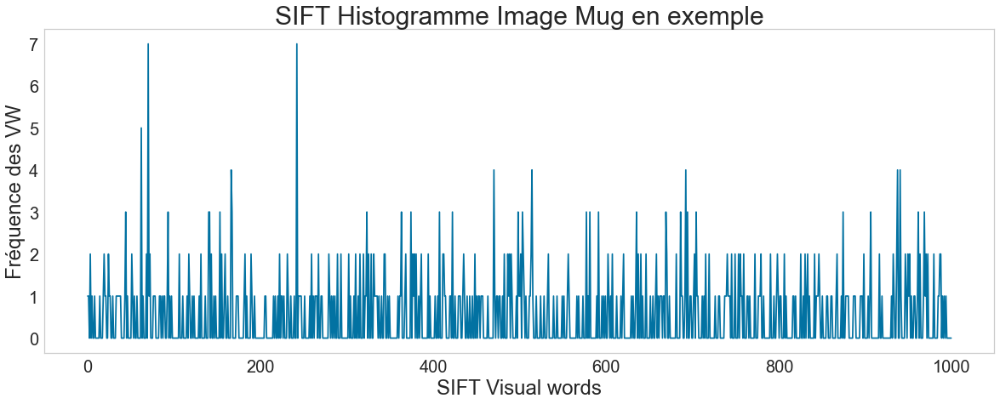

In [57]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu = df_sift_bovw[df_sift_bovw['image'] ==
                       '3c4ca34c50a5437a1bcc42b72fc1351f.jpg']['sift_bovw']
histo_mug = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image Mug en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_mug)
plt.show()

**ÉTAPE 5 - Réduction de dimension**  

In [58]:
type_donnee = 'TSNE_SIFT'

In [59]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_sift = list()
tsne_results_sift = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_sift = \
        tsne.fit_transform(df_sift_vectors)
    results_sift.append(tsne_results_sift)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.283s...
[t-SNE] Computed neighbors for 1050 samples in 2.380s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 3.728012
[t-SNE] KL divergence after 250 iterations with early exaggeration: 125.090454
[t-SNE] KL divergence after 500 iterations: 2.878276
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.191s...
[t-SNE] Computed neighbors for 1050 samples in 2.180s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.045649
[t-SNE] KL divergence after 250 iterations with early exaggeration: 121.316444
[t-SNE] KL divergence after 500 iterations: 2.579301
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.199s...
[t-SNE] Computed neighbors for 1050 samples in 

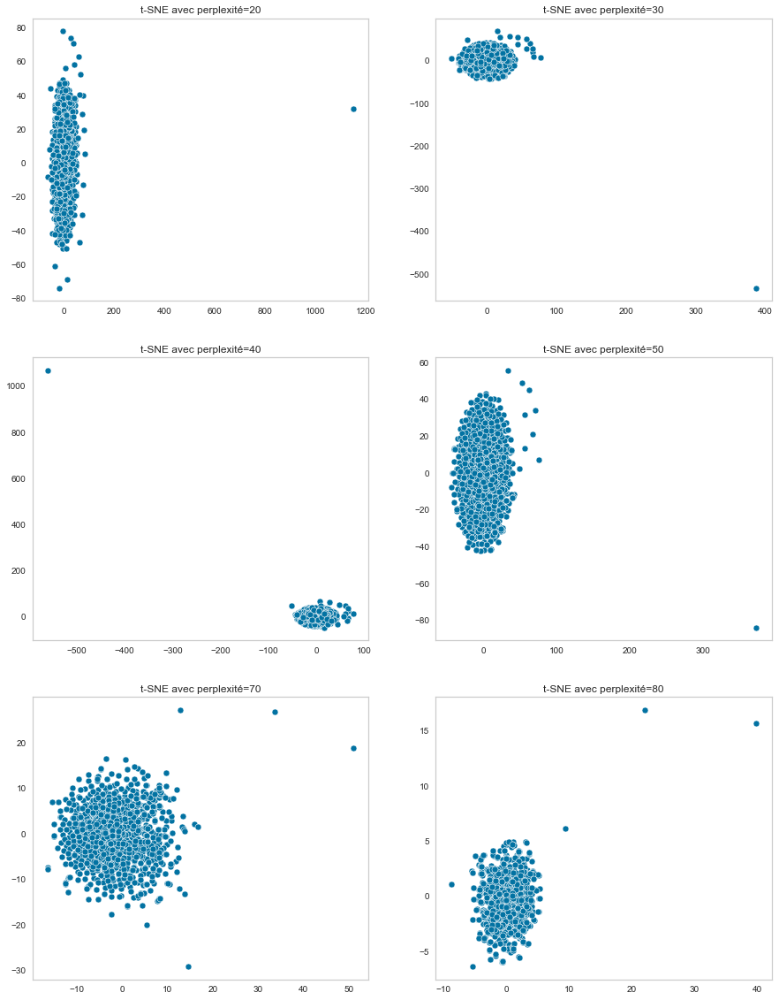

In [60]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_sift, liste_param, 1)

- groupes plus homogènes pour perplexité=70
- on laissera les paramètres learning_rate et n_iter par défaut (1000) et le nombre de composants par défaut (2).

In [61]:
%pycodestyle_off

In [62]:
# Réduction de dimension tsne
tsne_sift = TSNE(verbose=1, perplexity=70, n_iter=1000)
X_proj_tsne_sift = \
    tsne_sift.fit_transform(df_sift_vectors)
# Dataframe pour clustering
df_tsne_sift = pd.DataFrame({'VAR1' : X_proj_tsne_sift[:, 0],
                             'VAR2' : X_proj_tsne_sift[:, 1],
                             'CATEGORIE' : df_sift_bovw['Categorie_1'],
                             'IMAGE': df_sift_bovw['image'],
                             'IMAGE_LOC': df_sift_bovw['image_loc']})

[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.162s...
[t-SNE] Computed neighbors for 1050 samples in 2.613s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 4.850999
[t-SNE] KL divergence after 250 iterations with early exaggeration: 105.713707
[t-SNE] KL divergence after 1000 iterations: 1.698541


In [63]:
%pycodestyle_on

**Clustering**

In [64]:
cols = ['VAR1', 'VAR2']

In [84]:
# Initialisation du dataframe de sauvegarde des scores
df_scores = pd.DataFrame({})

In [66]:
# Initialisation du dataframe de sauvegarde des précisions
df_precision = pd.DataFrame({})

In [67]:
# Initialisation du dataframe de sauvegarde des métriques de clustering
df_metrics_clust = pd.DataFrame({})

In [68]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_sift[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,n_init,max_iter,coef_silh,dispersion,davies_bouldin,Durée (s)
TSNE_SIFT,50,100,0.37162,3279.65454,0.68556,0.42929
TSNE_SIFT,70,300,0.37162,3279.65454,0.68556,0.57055
TSNE_SIFT,70,400,0.37162,3279.65454,0.68556,0.59163
TSNE_SIFT,80,300,0.37162,3279.65454,0.68556,0.62308
TSNE_SIFT,70,100,0.37162,3279.65454,0.68556,0.64170
TSNE_SIFT,80,100,0.37162,3279.65454,0.68556,0.68567
TSNE_SIFT,50,200,0.37162,3279.65454,0.68556,0.83079
TSNE_SIFT,80,500,0.37162,3279.65454,0.68556,0.95468
TSNE_SIFT,50,300,0.37162,3279.65454,0.68556,1.01279
TSNE_SIFT,50,500,0.37162,3279.65454,0.68556,1.11129


In [85]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_sift = KMeans(n_clusters=7, init='k-means++',
                          n_init=100, max_iter=300,
                          random_state=seed) \
    .fit(df_tsne_sift[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_sift['Clusters'] = kmeans_tsne_sift.labels_
kmeans_tsne_sift_labels = kmeans_tsne_sift.labels_

In [86]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_sift,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_SIFT,0.03485,0.06200,0.07011,0.06581


In [87]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,151,14.38000
1,146,13.90000
2,1,0.10000
3,342,32.57000
4,129,12.29000
5,145,13.81000
6,136,12.95000


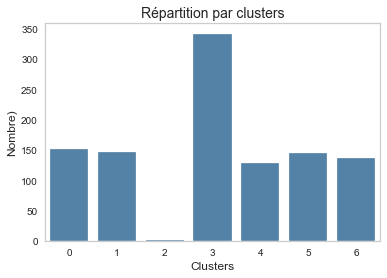

In [88]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_sift_labels)

In [89]:
# Les catégories par clusters
df_tsne_sift.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Baby Care                          38
         Home Furnishing                    27
         Computers                          25
         Watches                            20
         Home Decor & Festive Needs         19
         Beauty and Personal Care           11
         Kitchen & Dining                   11
1        Beauty and Personal Care           33
         Watches                            26
         Home Decor & Festive Needs         23
         Computers                          20
         Home Furnishing                    20
         Kitchen & Dining                   16
         Baby Care                           8
2        Home Furnishing                     1
3        Computers                          71
         Kitchen & Dining                   70
         Watches                            64
         Beauty and Personal Care           51
         Home Decor & Festive Needs         40
         Home Furnishing                    24
         Baby Care                          22
4        Baby Care                          35
         Kitchen & Dining                   23
         Beauty and Personal Care           19
         Home Furnishing                    15
         Home Decor & Festive Needs         14
         Watches                            14
         Computers                           9
5        Home Decor & Festive Needs         49
         Home Furnishing                    32
         Baby Care                          29
         Kitchen & Dining                   18
         Beauty and Personal Care           12
         Watches                             5
6        Home Furnishing                    31
         Computers                          25
         Beauty and Personal Care           24
         Watches                            21
         Baby Care                          18
         Kitchen & Dining                   12
         Home Decor & Festive Needs          5

**Visualisation des clusters**

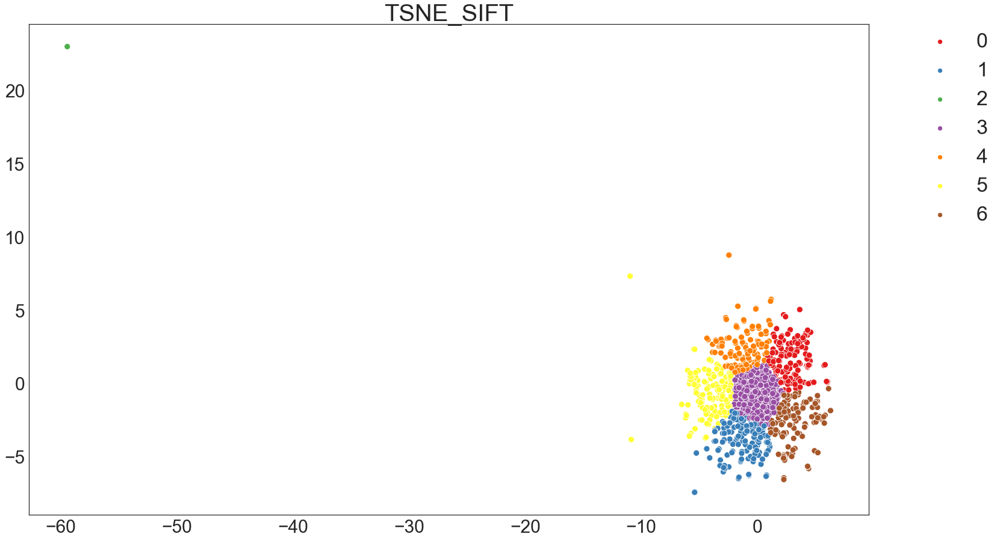

In [90]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_sift,
                                           kmeans_tsne_sift_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est faible (0.035).
- Cette combinaison TSNE SIFT sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Kitchen & Dining'. 

**Qualité de la catégorisation ?**

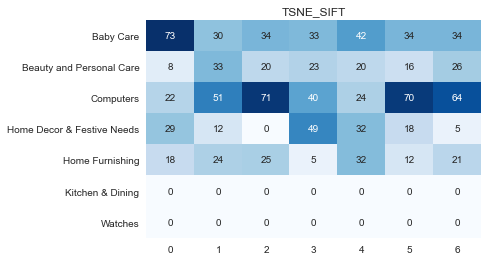

'Précision: 24.57%'

                            precision    recall  f1-score   support

                 Baby Care       0.49      0.26      0.34       280
  Beauty and Personal Care       0.22      0.23      0.22       146
                 Computers       0.47      0.21      0.29       342
Home Decor & Festive Needs       0.33      0.34      0.33       145
           Home Furnishing       0.21      0.23      0.22       137
          Kitchen & Dining       0.00      0.00      0.00         0
                   Watches       0.00      0.00      0.00         0

                  accuracy                           0.25      1050
                 macro avg       0.25      0.18      0.20      1050
              weighted avg       0.39      0.25      0.29      1050


In [91]:
dico_categories = {'0': 'Baby Care',
                   '1': 'Beauty and Personal Care',
                   '2': 'Home Furnishing',
                   '3': 'Computers',
                   '4': 'Baby Care',
                   '5': 'Home Decor & Festive Needs',
                   '6': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_sift,
                                          dico_categories, type_donnee)

In [92]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '24.57',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

In [93]:
# Sauvegarde du dataframe des TSNE SIFT
with open('sauvegarde/df_tsne_sift.pickle', 'wb') as f:
    pickle.dump(df_tsne_sift, f, pickle.HIGHEST_PROTOCOL)

**Erreurs**

In [94]:
# Nombre d'erreur
mask = df_tsne_sift['CATEGORIE'] == df_tsne_sift['Cluster_labels']
df_erreur_sift = df_tsne_sift[~mask]
display(f'Nombre d\'erreurs : {df_erreur_sift.shape[0]}')

"Nombre d'erreurs : 792"

**Répartition des erreurs par catégorie**

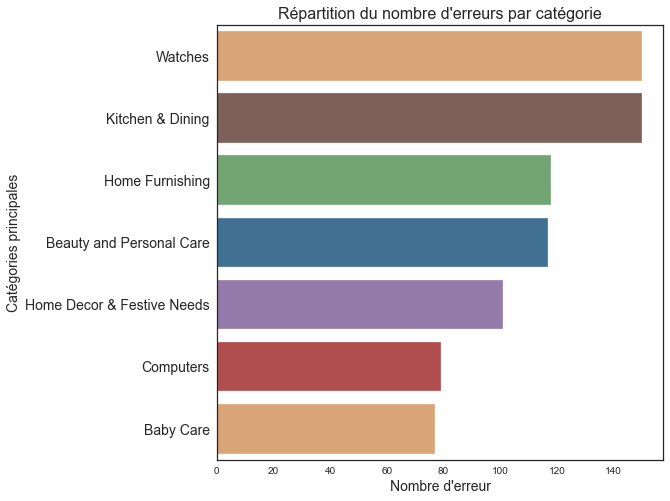

In [95]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_sift, orient='h',
              order=df_erreur_sift['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

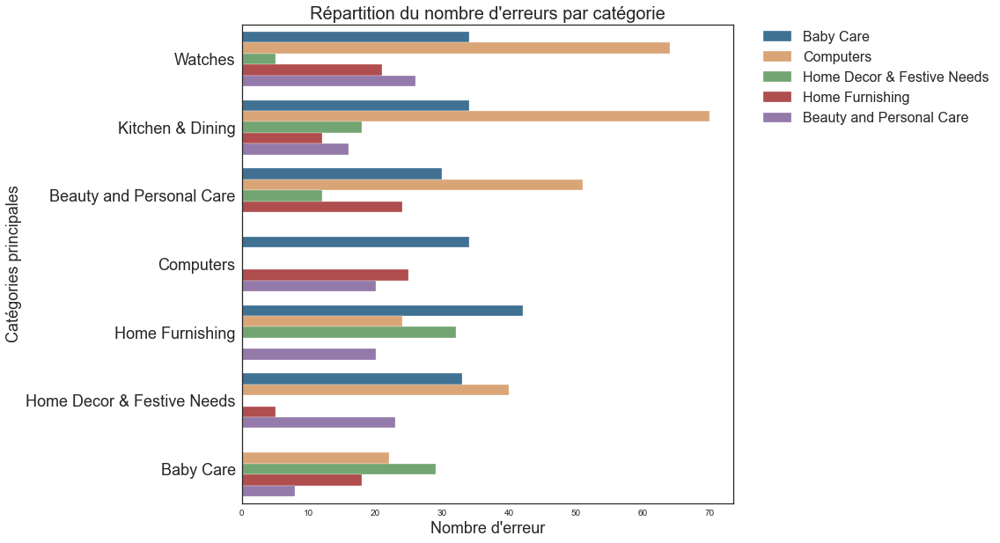

In [96]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_sift, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [97]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [100]:
df_visu_erreur = df_erreur_sift[['CATEGORIE', 'IMAGE_LOC',
                                 'Cluster_labels']].head(10)
display(HTML(df_visu_erreur.
             to_html(escape=False,
                     formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
0,Watches,,Baby Care
1,Kitchen & Dining,,Computers
3,Beauty and Personal Care,,Baby Care
4,Computers,,Baby Care
7,Kitchen & Dining,,Computers
8,Beauty and Personal Care,,Computers
9,Kitchen & Dining,,Baby Care
10,Kitchen & Dining,,Baby Care
11,Beauty and Personal Care,,Home Decor & Festive Needs
12,Computers,,Baby Care


In [102]:
# Sauvegarde du dataframe des erreurs SIFT
with open('sauvegarde/df_erreur_sift.pickle', 'wb') as f:
    pickle.dump(df_erreur_sift, f, pickle.HIGHEST_PROTOCOL)

**Comparaison avec classification supervisée**

In [109]:
# Initialisation du dataframe de sauvegarde des scores classif supervisée
df_scores_classif_sup = pd.DataFrame({})

In [110]:
data_cat = data['Categorie_1']

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.1716,0.0000,0.1650,0.1096,0.1267,0.0277,0.0301,0.0060
lr,Logistic Regression,0.1703,0.4965,0.1634,0.1100,0.1279,0.0259,0.0279,0.6250
ada,Ada Boost Classifier,0.1689,0.4997,0.1649,0.1752,0.1597,0.0283,0.0290,0.0160
lda,Linear Discriminant Analysis,0.1621,0.4915,0.1558,0.1056,0.1234,0.0162,0.0173,0.0050
nb,Naive Bayes,0.1567,0.5009,0.1513,0.1437,0.1271,0.0103,0.0111,0.0050
qda,Quadratic Discriminant Analysis,0.1539,0.5001,0.1501,0.1390,0.1267,0.0083,0.0091,0.0060
gbc,Gradient Boosting Classifier,0.1486,0.4999,0.1447,0.1442,0.1426,0.0050,0.0051,0.0900
xgboost,Extreme Gradient Boosting,0.1471,0.4961,0.1449,0.1486,0.1445,0.0037,0.0036,0.5880
dt,Decision Tree Classifier,0.1444,0.5006,0.1409,0.1518,0.1440,0.0007,0.0006,0.0060
lightgbm,Light Gradient Boosting Machine,0.1403,0.4818,0.1369,0.1456,0.1395,-0.0049,-0.0050,0.1760


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.1139,0,0.1239,0.0599,0.0770,-0.0177,-0.0195


Clusters,Nombre,%
Baby Care,63,19.94000
Computers,96,30.38000
Home Decor & Festive Needs,100,31.65000
Kitchen & Dining,57,18.04000


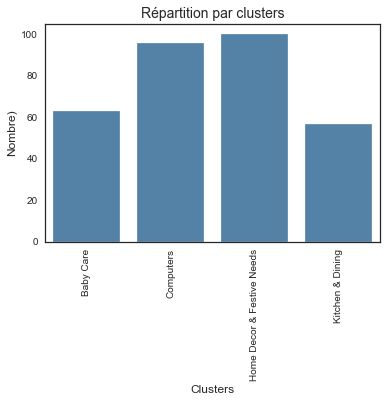

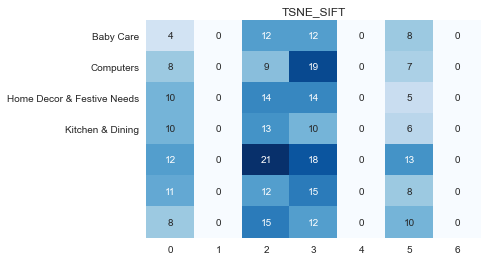

'Précision: 11.39%'

                            precision    recall  f1-score   support

                 Baby Care       0.06      0.11      0.08        36
  Beauty and Personal Care       0.00      0.00      0.00        43
                 Computers       0.15      0.33      0.20        43
Home Decor & Festive Needs       0.10      0.26      0.14        39
           Home Furnishing       0.00      0.00      0.00        64
          Kitchen & Dining       0.14      0.17      0.16        46
                   Watches       0.00      0.00      0.00        45

                  accuracy                           0.11       316
                 macro avg       0.06      0.12      0.08       316
              weighted avg       0.06      0.11      0.08       316


In [111]:
outils_nlp.classifier_pycaret(data_cat, df_sift_vectors, type_donnee)

In [112]:
# Sauvegarde des résultats
df_scores_classif_sup = \
    outils_images.sauvegarder_accuracy_class_sup_pycaret(
        df_scores_classif_sup, '0.1716', '0.1139', type_donnee)
df_scores_classif_sup[df_scores_classif_sup['Type_données'] == type_donnee]

,Type_données,Accuracy_train,Accuracy_test
0,TSNE_SIFT,0.1716,0.1139


**Bilan** :
- La classification supervisée obtient des moins bons résultats 11% de précision pour 25% pour le clustering non supervisé.

### <span style='background:PowderBlue'>4.2. Algorithme ORB</span>

- **ORB** (Oriented FAST and Rotated BRIEF) a été développé dans les laboratoires d'OpenCV par Ethan Rublee, Vincent Rabaud, Kurt Konolige et Gary R. Bradski en 2011, comme une alternative efficace et viable à SIFT et SURF. 
- ORB a été conçu principalement parce que SIFT et SURF sont des algorithmes brevetés. ORB, cependant, est libre d'utilisation.
- ORB est aussi performant que SIFT pour la détection des caractéristiques (et est meilleur que SURF) tout en étant presque deux ordres de grandeur plus rapide.
- ORB s'appuie sur le célèbre détecteur de points clés FAST et le descripteur BRIEF. Ces deux techniques sont intéressantes en raison de leurs bonnes performances et de leur faible coût. 
- Les principales contributions d'ORB sont les suivantes :
    - L'ajout d'une composante d'orientation rapide et précise à FAST.
    - Le calcul efficace des caractéristiques BRIEF orientées
    - L'analyse de la variance et de la corrélation des caractéristiques BRIEF orientées
    - Une méthode d'apprentissage pour la décorrélation des caractéristiques BRIEF sous invariance rotationnelle, conduisant à de meilleures performances dans les applications de type "nearest-neighbor".

[Source](https://medium.com/data-breach/introduction-to-orb-oriented-fast-and-rotated-brief-4220e8ec40cf)

### <span style='background:Moccasin'>4.2.1. Exemple sur une image</span>

<span style='background:PaleGreen'>**Chargement de l'image exemple pré-traitée**</span>

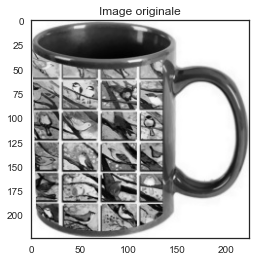

In [103]:
# Chargement de l'image précédemment traitée
mug = cv2.imread('data/Images_process/3c4ca34c50a5437a1bcc42b72fc1351f.jpg')
# Visualisation de l'image
plt.figure(figsize=(4, 4))
plt.title('Image originale')
plt.imshow(mug)
plt.show()

<span style='background:PaleGreen'>**Extraction des features - BOVW - Bags of Visual WOrds**</span>

In [104]:
# Transformation del'image en matrice de pixels pour OpenCV
mug = np.array(mug)
# Instanciation de ORB
orb = cv2.ORB_create()
# Extraction des points d'intérêt et des descripteurs
orb_keypoints, orb_descripteurs = orb.detectAndCompute(mug, None)
nb_feat = orb_descripteurs.shape[0]
nb_desc = orb_descripteurs.shape[1]
print(f'ORB Mug - Nombre de features={nb_feat} pour {nb_desc} descripteurs')

ORB Mug - Nombre de features=441 pour 32 descripteurs


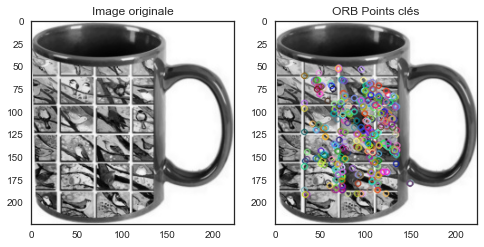

In [105]:
# Visualisation des points d'intérêt
orb_mug_keypoints = cv2.drawKeypoints(mug, orb_keypoints, None)

plt.figure(figsize=(8, 4))

# Image originale
plt.subplot(1, 2, 1)
plt.title('Image originale')
plt.imshow(mug)

# Image avec les points clés
plt.subplot(1, 2, 2)
plt.imshow(orb_mug_keypoints)
plt.title('ORB Points clés')
plt.show()

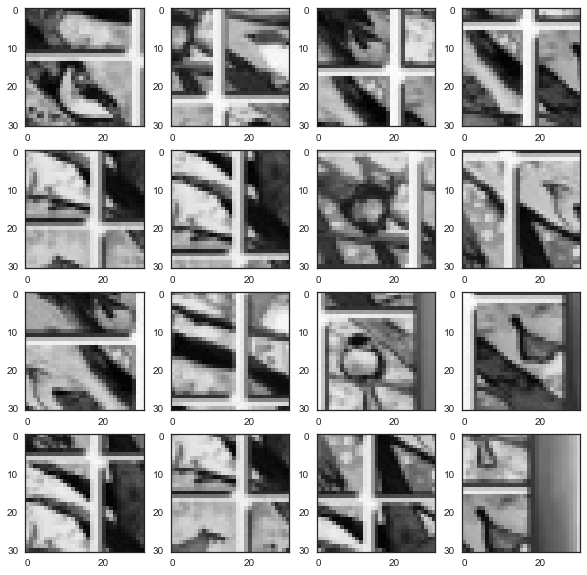

In [106]:
# Visualisation des 'Visual words'
outils_images.afficher_visual_words(mug, orb_keypoints)

### <span style='background:Moccasin'>4.2.2. ORB pour les 1050 images du jeu de données</span>

**ÉTAPE 0 - Chargement des images pré-traitées & 1 - Extraction des features - Visual Words**

In [42]:
# Chargement des images et extraction des features
orb_list_descripteurs, orb_lien_img_des = \
    outils_images.orb_charger_img_extraire_vw(data['image_proces2'])

In [44]:
orb_list_descripteurs.shape

(735579, 32)

In [45]:
len(orb_lien_img_des)

735579

In [46]:
# Sauvegarde des descripteurs ORB
with open('sauvegarde/orb_list_descripteurs.pickle', 'wb') as f:
    pickle.dump(orb_list_descripteurs, f, pickle.HIGHEST_PROTOCOL)

In [47]:
# Sauvegarde des descripteurs ORB
with open('sauvegarde/orb_lien_img_des.pickle', 'wb') as f:
    pickle.dump(orb_lien_img_des, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 2 - Création du dictionnaire de visual words - BOVW - Bags of Visual Words**  

- Pour créer le "dictionnaire" de visual words, il suffit d'appliquer un algorithme de clustering aux descripteurs de features construits à l'étape 1, comme le k-means. 
- Les visual words correspondent alors aux centres des clusters trouvés.
- On utilisera la fonction Kmeans() intégrée à OpenCV :
- Paramètres d'entrée
    - **samples** : Il doit être de type de données np.float32, et chaque caractéristique doit être mise dans une seule colonne.
    - **nclusters**(K) : Nombre de clusters requis à la fin du processus.
    - **criteria** : C'est le critère de fin d'itération. Lorsque ce critère est satisfait, l'itération de l'algorithme s'arrête. En fait, il devrait être un tuple de 3 paramètres. Ils sont ( type, max_iter, epsilon ) :
    Le type du critère de terminaison. Il a 3 drapeaux comme ci-dessous :
    cv.TERM_CRITERIA_EPS - arrête l'itération de l'algorithme si la précision spécifiée, epsilon, est atteinte.
    cv.TERM_CRITERIA_MAX_ITER - arrête l'algorithme après le nombre d'itérations spécifié, max_iter.
    cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER - arrête l'itération lorsque l'une des conditions ci-dessus est remplie.
    - **max_iter** - Un nombre entier spécifiant le nombre maximum d'itérations.
    - **epsilon** - Précision requise
    - **attempts** : Flag permettant de spécifier le nombre de fois où l'algorithme est exécuté en utilisant différentes étiquetages initiaux. L'algorithme renvoie les étiquettes qui donnent la meilleure compacité. Cette compacité est renvoyée en sortie.
    - **flags** : Ce drapeau est utilisé pour spécifier comment les centres initiaux sont pris. Normalement, deux drapeaux sont utilisés pour cela : cv.KMEANS_PP_CENTERS et cv.KMEANS_RANDOM_CENTERS.

[Source](https://docs.opencv.org/master/d1/d5c/tutorial_py_kmeans_opencv.html)

In [49]:
# Test du KMeans mis à disposition
# -------------------------------------------------------------------
# Define criteria = ( type, max_iter = 10 , epsilon = 1.0 )
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

# Set flags (Just to avoid line break in the code)
flags = cv2.KMEANS_PP_CENTERS  # kmeans++

# Apply KMeans
compactness, orb_labels, centers = cv2.kmeans(orb_list_descripteurs, 1000,
                                              None, criteria, 1, flags)

**ÉTAPE 4 - Construction de l'histogramme pour chaque image**  

- Pour chaque image, on crée un histogramme qui indique la fréquence d'apparition de chaque visual word dans l'image.
- Le bag-of-features d'une image est le vecteur dans lequel on a stocké les valeurs de l'histogramme et qu'on a normalisé (en divisant par la norme euclidienne). 

In [86]:
# Extraction des BOVW ORB
outils_images.orb_constituter_bovw(data, 'image_proces2', 'orb_bovw',
                                   orb_labels, orb_lien_img_des)

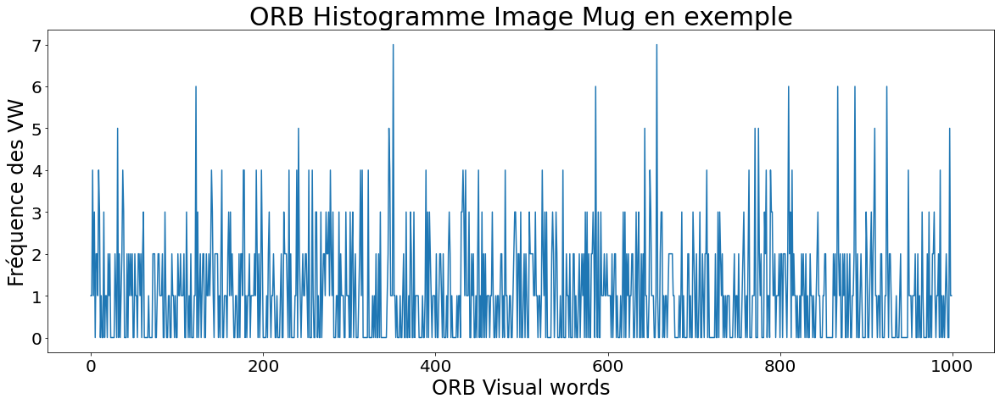

In [92]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu_orb = data[data['image'] ==
                   '3c4ca34c50a5437a1bcc42b72fc1351f.jpg']['orb_bovw']
histo_mug = df_visu_orb.to_list()[0]
plt.figure(figsize=(20, 7))
plt.title('ORB Histogramme Image Mug en exemple', fontsize=30)
plt.xlabel('ORB Visual words', fontsize=24)
plt.ylabel('Fréquence des VW', fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_mug)
plt.show()

In [95]:
# Dataframe de sauvegarde des BOVW ORB
df_orb_bovw = data[['image', 'image_loc', 'Categorie_1', 'orb_bovw']]
# Constituer le dataframe de vecteurs de BOVW
df_orb_vectors = \
    outils_images.constituer_dataframe_vectors(df_orb_bovw, 'orb_bovw')

In [98]:
# Sauvegarde des BOVW ORB
with open('sauvegarde/df_orb_bovw.pickle', 'wb') as f:
    pickle.dump(df_orb_bovw, f, pickle.HIGHEST_PROTOCOL)

In [99]:
# Sauvegarde du dataframe des vectors BOVW ORB
with open('sauvegarde/df_orb_vectors.pickle', 'wb') as f:
    pickle.dump(df_orb_vectors, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 5 - Réduction de dimension**  

In [100]:
type_donnee = 'TSNE_ORB'

In [101]:
# t-SNE tuning du paramètre perplexity sans initialisation PCA
top_depart = time.time()
liste_param = [20, 30, 40, 50, 70, 80]
results_orb = list()
tsne_results_orb = []
for i in liste_param:
    tsne = TSNE(n_components=2, verbose=1, perplexity=i, n_iter=500,
                random_state=seed)
    tsne_results_orb = \
        tsne.fit_transform(df_orb_vectors)
    results_orb.append(tsne_results_orb)
print('t-SNE terminée! en : {} seconds'.format(time.time()-top_depart))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.184s...
[t-SNE] Computed neighbors for 1050 samples in 2.020s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 6.882798
[t-SNE] KL divergence after 250 iterations with early exaggeration: 113.128578
[t-SNE] KL divergence after 500 iterations: 2.316170
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.202s...
[t-SNE] Computed neighbors for 1050 samples in 1.959s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 7.409527
[t-SNE] KL divergence after 250 iterations with early exaggeration: 105.508110
[t-SNE] KL divergence after 500 iterations: 2.098888
[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.207s...
[t-SNE] Computed neighbors for 1050 samples in 

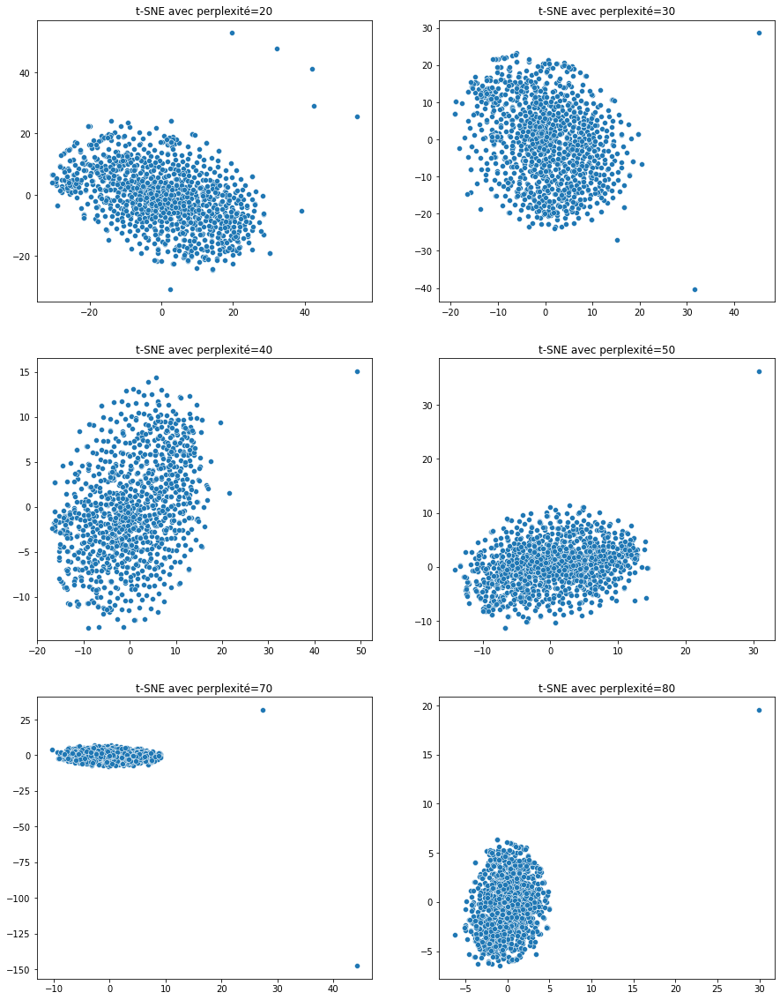

In [102]:
# Visualisation en 2D des différents résultats selon la perplexité
outils_segmentation.affiche_tsne(results_orb, liste_param, 1)

- groupes plus homogènes pour perplexité=50
- on laissera les paramètres learning_rate et n_iter à 5000 et le nombre de composants par défaut (2).

In [104]:
%pycodestyle_off

In [106]:
# Réduction de dimension tsne
tsne_orb = TSNE(verbose=1, perplexity=50, n_iter=5000)
X_proj_tsne_orb = \
    tsne_orb.fit_transform(df_orb_vectors)
# Dataframe pour clustering
df_tsne_orb = pd.DataFrame({'VAR1' : X_proj_tsne_orb[:, 0],
                            'VAR2' : X_proj_tsne_orb[:, 1],
                            'CATEGORIE' : df_orb_bovw['Categorie_1'],
                            'IMAGE': df_orb_bovw['image'],
                            'IMAGE_LOC': df_orb_bovw['image_loc']})

In [107]:
%pycodestyle_on

**Clustering**

In [108]:
cols = ['VAR1', 'VAR2']

In [115]:
# Chargement des dataframes de sauvegarde des scores
df_scores = pd.read_csv('IMAGES_data_df_scores.csv')
# Suppression de l'entête des objets
df_scores.drop(0, 0, inplace=True)

In [117]:
# Chargement des dataframes de sauvegarde des précisions
df_precision = pd.read_csv('IMAGES_data_df_precision.csv')
# Suppression de l'entête des objets
df_precision.drop(0, 0, inplace=True)

In [123]:
# Chargement des dataframes de sauvegarde des métriques de clustering
df_metrics_clust = pd.read_csv('IMAGES_data_kmeans_metrics.csv')
# Suppression de l'entête des objets
df_metrics_clust.drop(0, 0, inplace=True)

In [124]:
# Tuning hyperparametres n_init, max_iter
# Paramètres à tester
n_init = [10, 20, 30, 50, 70, 80, 100]
max_iter = [100, 200, 300, 400, 500]
# Métriques avec les différentes combinaisons des paramètres
df_metrics_clust = \
    outils_nlp.calcul_metrics_kmeans(df_tsne_orb[cols],
                                     df_metrics_clust,
                                     type_donnee,
                                     seed, n_init, max_iter)
# Tri par indice de dispersion : proche de 0
df_metrics_clust[df_metrics_clust['Type_données'] == type_donnee] \
    .sort_values(by=['coef_silh', 'davies_bouldin', 'Durée (s)'],
                 ascending=[False, True, True]).style.hide_index()

Type_données,Param_k,dispersion,Durée (s),n_init,max_iter,coef_silh,davies_bouldin
TSNE_ORB,nan,5631.12891,0.06084,10.00000,300.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12842,0.06084,10.00000,400.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.06084,10.00000,500.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.06183,10.00000,200.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.10273,10.00000,100.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.12965,20.00000,400.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12842,0.13065,20.00000,300.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.13165,20.00000,200.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.13264,20.00000,500.00000,0.34348,0.75417
TSNE_ORB,nan,5631.12891,0.43484,20.00000,100.00000,0.34348,0.75417


In [133]:
# Instanciation du modèle KMeans avec les meilleurs paramètres
kmeans_tsne_orb = KMeans(n_clusters=7, init='k-means++',
                         n_init=10, max_iter=300,
                         random_state=seed) \
    .fit(df_tsne_orb[cols])
# Ajout de l'assignation du cluster au dataframe
df_tsne_orb['Clusters'] = kmeans_tsne_orb.labels_
kmeans_tsne_orb_labels = kmeans_tsne_orb.labels_

In [135]:
# Scores ?
df_scores = outils_nlp.calcul_metriques_clusters(df_tsne_orb,
                                                 df_scores,
                                                 type_donnee)
df_scores[df_scores['Type_données'] == type_donnee].style.hide_index()

Type_données,ARI,Homogénéité,Complétude,V-measure
TSNE_ORB,0.02930,0.05279,0.05821,0.05537


In [136]:
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_scores, 'IMAGES_data_df_scores.csv')

Clusters,Nombre,%
0,150,14.29000
1,281,26.76000
2,149,14.19000
3,1,0.10000
4,150,14.29000
5,167,15.90000
6,152,14.48000


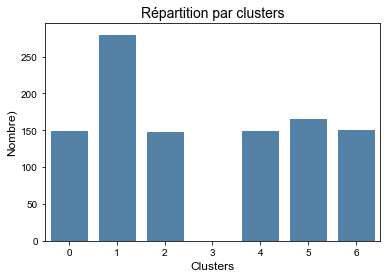

In [137]:
outils_nlp.affiche_repartition_par_clusters(kmeans_tsne_orb_labels)

In [139]:
# Les catégories par clusters
df_tsne_orb.groupby('Clusters')['CATEGORIE'].value_counts(). \
    to_frame()

CATEGORIE
Clusters CATEGORIE                            
0        Home Furnishing                    38
         Baby Care                          37
         Home Decor & Festive Needs         24
         Beauty and Personal Care           16
         Watches                            16
         Kitchen & Dining                   15
         Computers                           4
1        Watches                            63
         Kitchen & Dining                   51
         Beauty and Personal Care           38
         Computers                          35
         Home Furnishing                    34
         Baby Care                          32
         Home Decor & Festive Needs         28
2        Kitchen & Dining                   34
         Computers                          32
         Beauty and Personal Care           25
         Home Decor & Festive Needs         23
         Watches                            20
         Baby Care                          10
         Home Furnishing                     5
3        Kitchen & Dining                    1
4        Computers                          57
         Home Decor & Festive Needs         22
         Baby Care                          20
         Beauty and Personal Care           20
         Kitchen & Dining                   17
         Home Furnishing                     7
         Watches                             7
5        Baby Care                          35
         Home Furnishing                    31
         Beauty and Personal Care           26
         Watches                            24
         Home Decor & Festive Needs         23
         Kitchen & Dining                   16
         Computers                          12
6        Home Furnishing                    35
         Home Decor & Festive Needs         30
         Beauty and Personal Care           25
         Watches                            20
         Baby Care                          16
         Kitchen & Dining                   16
         Computers                          10

**Visualisation des clusters**

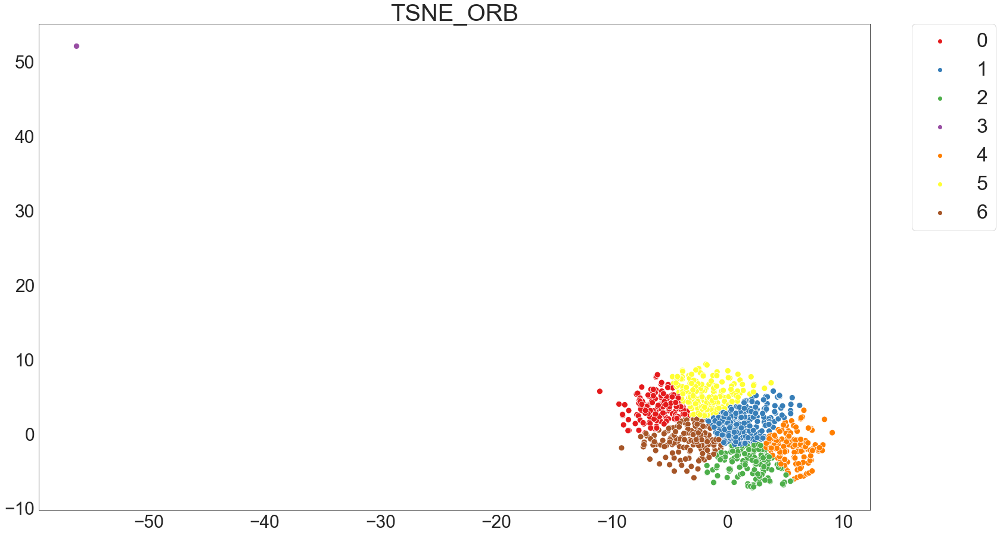

In [141]:
# Visualisation des clusters
outils_nlp.affiche_projection_par_clusters(X_proj_tsne_orb,
                                           kmeans_tsne_orb_labels,
                                           type_donnee)

**Bilan** :
***
- Le score ARI est faible (0.029).
- Cette combinaison TSNE ORB sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 
- Il manque la catégorie 'Home Decor & Festive Needs'. 

**Qualité de la catégorisation ?**

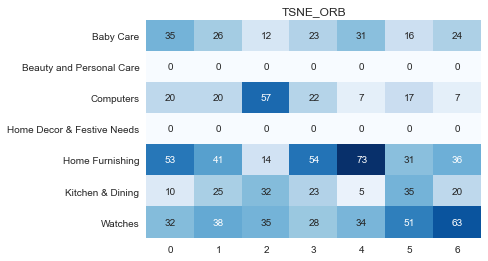

'Précision: 25.05%'

                            precision    recall  f1-score   support

                 Baby Care       0.23      0.21      0.22       167
  Beauty and Personal Care       0.00      0.00      0.00         0
                 Computers       0.38      0.38      0.38       150
Home Decor & Festive Needs       0.00      0.00      0.00         0
           Home Furnishing       0.49      0.24      0.32       302
          Kitchen & Dining       0.23      0.23      0.23       150
                   Watches       0.42      0.22      0.29       281

                  accuracy                           0.25      1050
                 macro avg       0.25      0.18      0.21      1050
              weighted avg       0.38      0.25      0.29      1050


In [142]:
dico_categories = {'0': 'Home Furnishing',
                   '1': 'Watches',
                   '2': 'Kitchen & Dining',
                   '3': 'Kitchen & Dining',
                   '4': 'Computers',
                   '5': 'Baby Care',
                   '6': 'Home Furnishing'}
outils_nlp.affiche_qualite_categorisation(df_tsne_orb,
                                          dico_categories, type_donnee)

In [143]:
# Sauvegarde des précisions de la catégorisation
df_precision = outils_nlp.sauvegarde_precision(df_precision, '25',
                                               type_donnee)
# Sauvegarde des dataframes de trace
outils_data.to_csv(df_precision, 'IMAGES_data_df_precision.csv')

**Erreurs**

In [144]:
# Nombre d'erreur
mask = df_tsne_orb['CATEGORIE'] == df_tsne_orb['Cluster_labels']
df_erreur_orb = df_tsne_orb[~mask]
display(f'Nombre d\'erreurs : {df_erreur_orb.shape[0]}')

"Nombre d'erreurs : 787"

**Répartition des erreurs par catégorie**

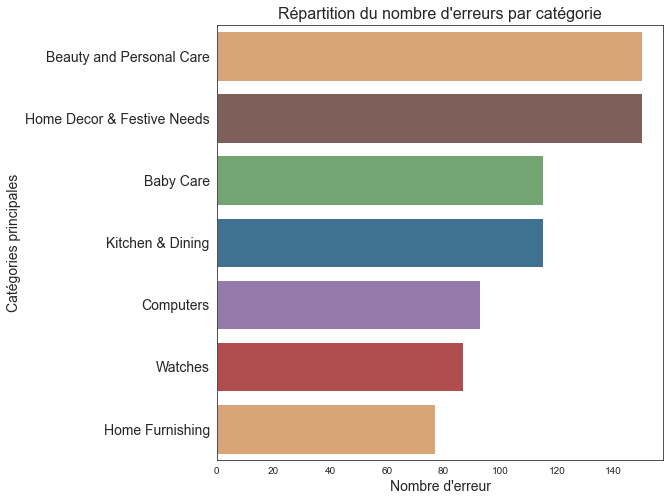

In [145]:
# Répartition des erreurs par catégorie
plt.figure(figsize=(8, 8))
sns.countplot(y='CATEGORIE', data=df_erreur_orb, orient='h',
              order=df_erreur_orb['CATEGORIE'].value_counts().index,
              palette=['#e9a467', '#845b53', '#6bad6b', '#3274a1',
                       '#9372b2', '#c03d3e'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=16)
plt.xlabel('Nombre d\'erreur', fontsize=14)
plt.ylabel('Catégories principales', fontsize=14)
plt.yticks(fontsize=14)
plt.show()

**Répartition des erreurs des catégories par catégorie**

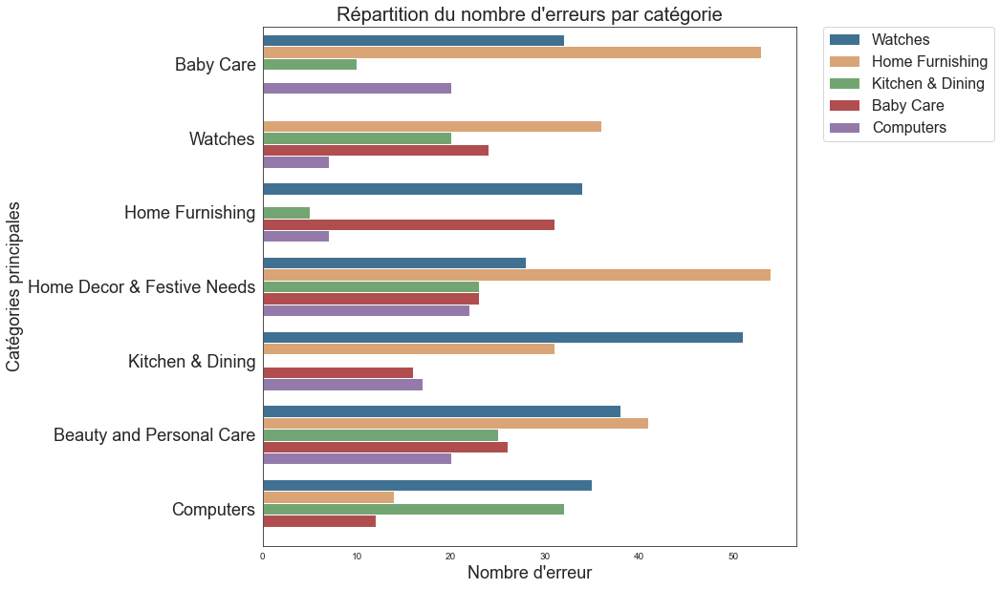

In [146]:
# Répartition des erreurs des catégories par catégorie
plt.figure(figsize=(10, 10))
sns.countplot(y='CATEGORIE', hue='Cluster_labels',
              data=df_erreur_orb, orient='h',
              palette=['#3274a1', '#e9a467', '#6bad6b', '#c03d3e',
                       '#9372b2', '#845b53', '#d684bd'])
plt.title('Répartition du nombre d\'erreurs par catégorie', fontsize=20)
plt.xlabel('Nombre d\'erreur', fontsize=18)
plt.ylabel('Catégories principales', fontsize=18)
plt.yticks(fontsize=18)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=16)
plt.show()

**Exemple d'erreurs**

In [147]:
def path_to_image_photo_html(path):
    return '<img src="' + path + ' " width="100">'

In [159]:
df_visu_erreur_orb = df_erreur_orb[['CATEGORIE', 'IMAGE_LOC',
                                    'Cluster_labels']].sample(10)
display(HTML(
    df_visu_erreur_orb.
    to_html(escape=False,
            formatters=dict(IMAGE_LOC=path_to_image_photo_html))))

,CATEGORIE,IMAGE_LOC,Cluster_labels
102,Home Decor & Festive Needs,,Computers
423,Computers,,Watches
445,Computers,,Baby Care
1030,Beauty and Personal Care,,Kitchen & Dining
30,Watches,,Kitchen & Dining
66,Baby Care,,Watches
710,Home Decor & Festive Needs,,Home Furnishing
586,Watches,,Home Furnishing
426,Baby Care,,Computers
1018,Computers,,Watches


**Comparaison avec classification supervisée**

In [166]:
# Chargement des dataframes de sauvegarde des scores classif supervisée
df_scores_classif_sup = pd.read_csv('IMAGES_data_scores_class_sup.csv')
# Suppression de l'entête des objets
df_scores_classif_sup.drop(0, 0, inplace=True)

In [160]:
data_cat = data['Categorie_1']

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
catboost,CatBoost Classifier,0.2630,0.6307,0.2618,0.2675,0.2575,0.1388,0.1400,1.7110
knn,K Neighbors Classifier,0.2616,0.5986,0.2591,0.2708,0.2505,0.1354,0.1377,0.1890
lightgbm,Light Gradient Boosting Machine,0.2615,0.6174,0.2601,0.2682,0.2582,0.1375,0.1387,0.2610
qda,Quadratic Discriminant Analysis,0.2562,0.6158,0.2533,0.2642,0.2251,0.1297,0.1351,0.0060
rf,Random Forest Classifier,0.2521,0.6167,0.2491,0.2514,0.2470,0.1260,0.1268,0.0380
et,Extra Trees Classifier,0.2453,0.6133,0.2435,0.2442,0.2404,0.1184,0.1191,0.0350
xgboost,Extreme Gradient Boosting,0.2440,0.6144,0.2415,0.2546,0.2401,0.1157,0.1170,0.5820
gbc,Gradient Boosting Classifier,0.2370,0.6233,0.2323,0.2379,0.2309,0.1075,0.1086,0.0910
ridge,Ridge Classifier,0.2276,0.0000,0.2166,0.1357,0.1448,0.0914,0.1054,0.0050
lr,Logistic Regression,0.2262,0.6059,0.2200,0.1894,0.1813,0.0927,0.0981,0.3980


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,CatBoost Classifier,0.2975,0.6659,0.3038,0.3221,0.2988,0.1829,0.1850


Clusters,Nombre,%
Baby Care,64,20.25000
Beauty and Personal Care,41,12.97000
Computers,50,15.82000
Home Decor & Festive Needs,41,12.97000
Home Furnishing,40,12.66000
Kitchen & Dining,25,7.91000
Watches,55,17.41000


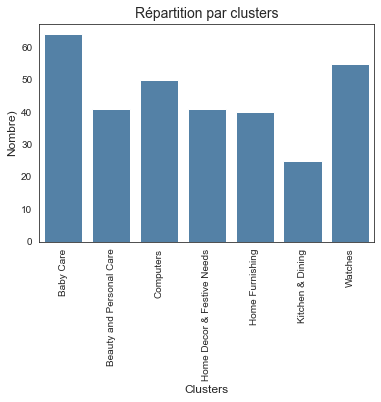

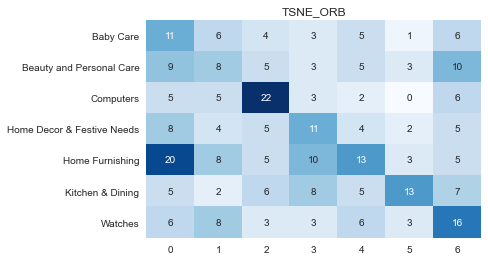

'Précision: 29.75%'

                            precision    recall  f1-score   support

                 Baby Care       0.17      0.31      0.22        36
  Beauty and Personal Care       0.20      0.19      0.19        43
                 Computers       0.44      0.51      0.47        43
Home Decor & Festive Needs       0.27      0.28      0.28        39
           Home Furnishing       0.33      0.20      0.25        64
          Kitchen & Dining       0.52      0.28      0.37        46
                   Watches       0.29      0.36      0.32        45

                  accuracy                           0.30       316
                 macro avg       0.32      0.30      0.30       316
              weighted avg       0.32      0.30      0.30       316


In [161]:
outils_nlp.classifier_pycaret(data_cat, df_orb_vectors, type_donnee)

In [172]:
# Sauvegarde des résultats
df_scores_classif_sup = \
    outils_images.sauvegarder_accuracy_class_sup_pycaret(
        df_scores_classif_sup, '0.2630', '0.2975', type_donnee)
df_scores_classif_sup[df_scores_classif_sup['Type_données'] == type_donnee]

,Type_données,Accuracy_train,Accuracy_test
1,TSNE_ORB,0.2630,0.2975


**Bilan** :
- La classification supervisée obtient de meilleurs résultats avec 30% de précision contre 25% pour le clustering non supervisé. 
- Mais ni la technique SIFT, ni la technique ORB ne parvient à trouver les 7 catégories sur notre jeu de données et ne peuvent être donc envisagées.

### <span style='background:PowderBlue'>4.3. Algorithme SURF</span>

In [175]:
# Version de OpenCV ?
cv2.__version__

'4.5.1'

In [176]:
surf = cv2.xfeatures2d.SURF_create()

error: OpenCV(4.5.1) ..\opencv_contrib\modules\xfeatures2d\src\surf.cpp:1029: error: (-213:The function/feature is not implemented) This algorithm is patented and is excluded in this configuration; Set OPENCV_ENABLE_NONFREE CMake option and rebuild the library in function 'cv::xfeatures2d::SURF::create'


**Bilan** :
- SURF n'est pas intégré dans la version 4.5.1 d'OpenCV et semble ne pas être libre.
- L'utilisation de l'algorithme SURF ne sera pas mis en oeuvre.